# 2023A - Sparkle Datasets - testing

In [3]:
from astropy.io import fits
import os
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
import tempfile
import imageio
from scipy import signal
from importlib import reload
from scipy.optimize import curve_fit
import pandas as pd
# importing the new code
#import sparkles as spkl
import sprkls_pool as spkl

In [4]:
# calibration files
data_dir = '/home/eden/data/2023A/'
dir_calib = '../data/calib/'
mask = 'aol1_wfsmask.fits'
ref = 'aol1_wfsref.fits'
dark = 'camwfs-dark_bin2_2000.000000_600.000000_-45.000000__T20220422005142597501326.fits'

# March 05 - piPup
triggered untrigger 0.5 as seeing

### Self_RMs

In [16]:
# New Self-RMs
RM_dir = "/home/eden/data/2023A/self_RMs/"
self_RM = os.listdir(RM_dir)
self_RM

# pulling and naming files
data_t_1800 = fits.open(RM_dir + self_RM[0])[0].data
print("data spark trig: ", self_RM[0])
data_nt_1800 = fits.open(RM_dir + self_RM[1])[0].data
print("data spark no trig: ", self_RM[1])

data spark trig:  selfRM_20230304_05_piPup_sparkles_nottriggered.fits
data spark no trig:  selfRM_20230304_05_piPup_sparkles_triggered.fits


In [17]:
# old self RMs
# want 01 - not triggered, want 03 - triggered

oRM_dir = "/home/eden/data/2022B/self_RMs/"
oself_RM = os.listdir(oRM_dir)

# pulling and naming files
lab_t_1800 = fits.open(oRM_dir + oself_RM[5])[0].data
print("lab spark trig: ", oself_RM[5])
lab_nt_1800 = fits.open(oRM_dir + oself_RM[3])[0].data
print("lab spark no trig: ", oself_RM[3])


lab spark trig:  selfRM_sparkles_20221211_12_003.fits
lab spark no trig:  selfRM_sparkles_20221211_12_001.fits


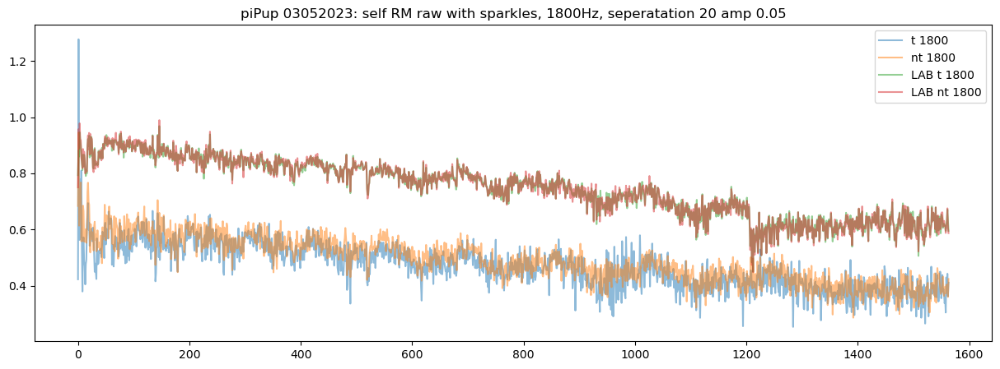

In [18]:
# selfRM RAW
fig = plt.figure(figsize=(15,5), facecolor='white')
plt.plot(np.diag(data_t_1800[5]), label="t 1800", alpha=0.5)
plt.plot(np.diag(data_nt_1800[5]), label="nt 1800", alpha=0.5)
plt.plot(np.diag(lab_t_1800[5]), label="LAB t 1800", alpha=0.5)
plt.plot(np.diag(lab_nt_1800[5]), label="LAB nt 1800", alpha=0.5)
plt.legend()
plt.title("piPup 03052023: self RM raw with sparkles, 1800Hz, seperatation 20 amp 0.05")
plt.show()

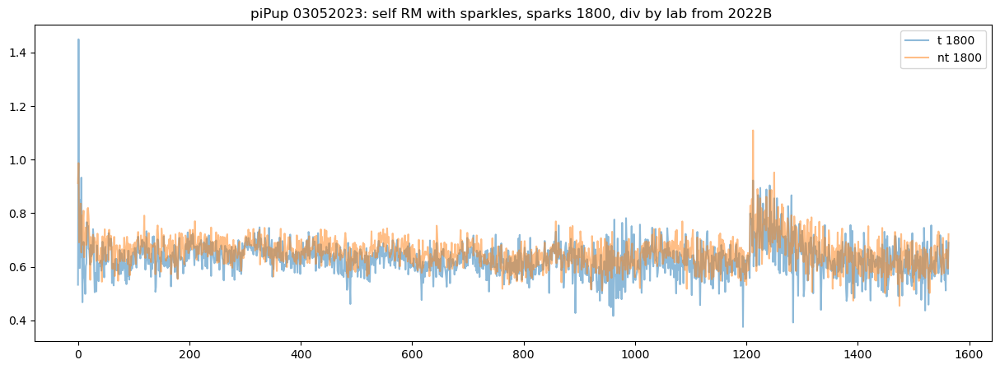

In [19]:
# selfRM RATIOs - this is the gain
# Plotting the diagonal of the 6th frame to see the modal response. 
fig = plt.figure(figsize=(15,5), facecolor='white')
plt.plot(np.diag(data_t_1800[5])/np.diag(lab_t_1800[5]), label="t 1800", alpha=0.5)
plt.plot(np.diag(data_nt_1800[5])/np.diag(lab_nt_1800[5]), label="nt 1800", alpha=0.5)
plt.legend()
plt.title("piPup 03052023: self RM with sparkles, sparks 1800, div by lab from 2022B ")
plt.show()

### WFS data

In [3]:
# data - sky
sky_t_dir_0305 = "/home/eden/data/2023A/0305_spark_triggered/camwfs/"
sky_nt_dir_0305 = "/home/eden/data/2023A/0305_spark_nottriggered/camwfs/"

# data - lab
lab_t_dir_0305 = "/home/eden/data/2023A/0305_lab_triggered/camwfs/"
lab_nt_dir_0305 = "/home/eden/data/2023A/0305_lab_nottriggered/camwfs/"


In [4]:
# create sparkle object
reload(spkl)
# Sky sparkles
sp_trigg = spkl.Spark(sky_t_dir_0305, lab_t_dir_0305, dir_calib, dark, mask, ref)
sp_nottrigg = spkl.Spark(sky_nt_dir_0305, lab_nt_dir_0305, dir_calib, dark, mask, ref)


FileNotFoundError: [Errno 2] No such file or directory: '/home/eden/data/2023A/0305_lab_triggered/camwfs/'

In [22]:
sp_l_trigg = spkl.Spark(lab_t_dir_0305, lab_t_dir_0305, dir_calib, dark, mask, ref)
sp_l_nottrigg = spkl.Spark(lab_nt_dir_0305, lab_nt_dir_0305, dir_calib, dark, mask, ref)

=> Sampling 100 files, starting at 0
100
=> Sampling 100 files, starting at 0
100


In [30]:
# on sky dot products - with lab as the reference
data_sp_trigg = np.array(sp_trigg.dot_list_pool(n=100000, n_workers=40))
data_sp_nottrigg = np.array(sp_nottrigg.dot_list_pool(n=100000, n_workers=40))
# lab dot products for comparison (do we see jumps?)
data_sp_l_trigg = np.array(sp_l_trigg.dot_list_pool(n=100000, n_workers=40))
data_sp_l_nottrigg = np.array(sp_l_nottrigg.dot_list_pool(n=100000, n_workers=40))

chunksize=2500, n_workers=40
chunksize=2500, n_workers=40
chunksize=2500, n_workers=40
chunksize=2500, n_workers=40


#### Quick Summary

In [ ]:
# vector basis set? I am just doing the cosine...

# dot product to linearly combine to get into lab 

#### Dotproduct time series

In [153]:
# Sky splits
refsplit1_trigg = [data_sp_trigg[i::4,i] for i in range(4)]
refsplit1_nottrigg = [data_sp_nottrigg[i::4,i] for i in range(4)]

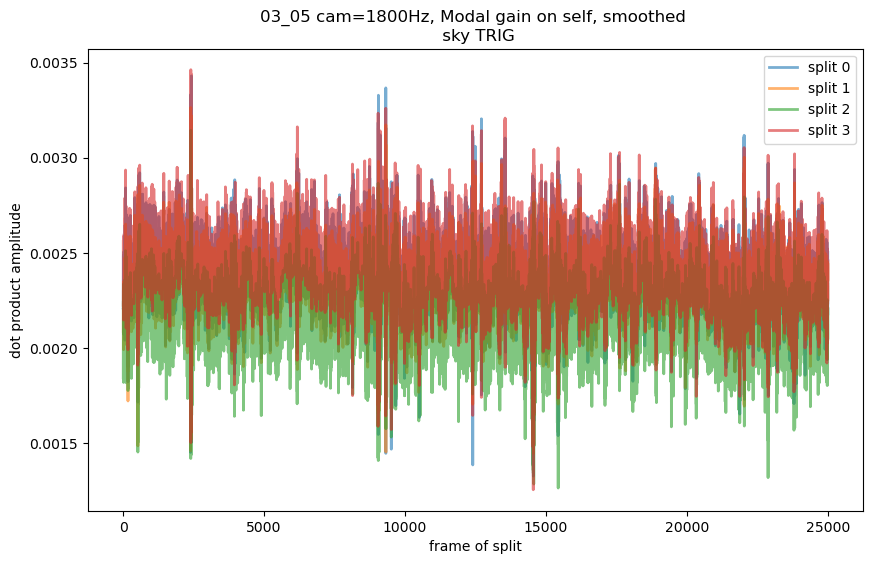

In [154]:
# Dotproduct onsky dataset TRIG
fig = plt.figure(figsize=(10,6), facecolor='white')

for e in range(4):
    plt.plot(refsplit1_trigg[e], lw=2, alpha = 0.6, label = f'split {e}')
    
plt.legend()
plt.xlabel('frame of split')
plt.ylabel('dot product amplitude')
plt.title(f"03_05 cam=1800Hz, Modal gain on self, smoothed \n sky TRIG")
plt.show()

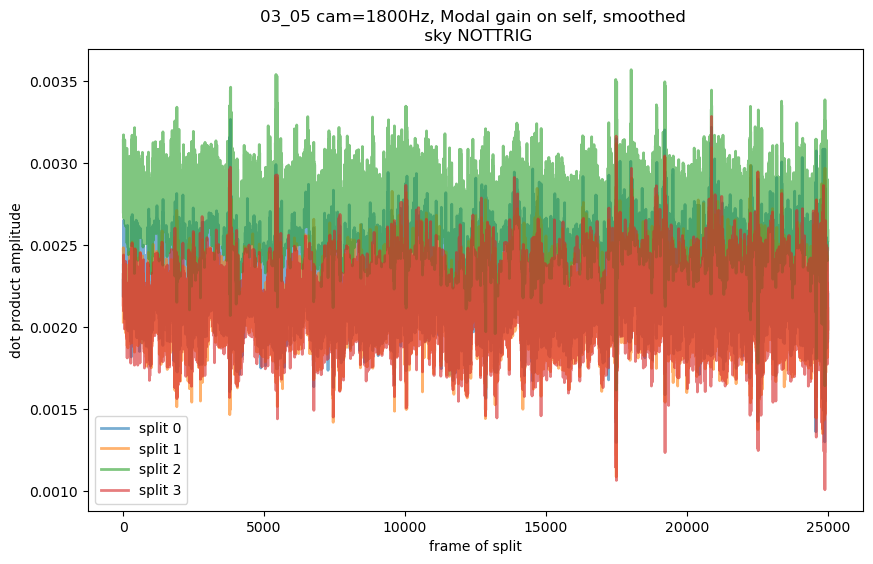

In [155]:
# Dotproduct onsky dataset NOTTRIG
fig = plt.figure(figsize=(10,6), facecolor='white')

for e in range(4):
    plt.plot(refsplit1_nottrigg[e], lw=2, alpha = 0.6, label = f'split {e}')
    
plt.legend()
plt.xlabel('frame of split')
plt.ylabel('dot product amplitude')
plt.title(f"03_05 cam=1800Hz, Modal gain on self, smoothed \n sky NOTTRIG")
plt.show()

In [156]:
# LAB splits
refsplit1_l_trigg = [data_sp_l_trigg[i::4,i] for i in range(4)]
refsplit1_l_nottrigg = [data_sp_l_nottrigg[i::4,i] for i in range(4)]

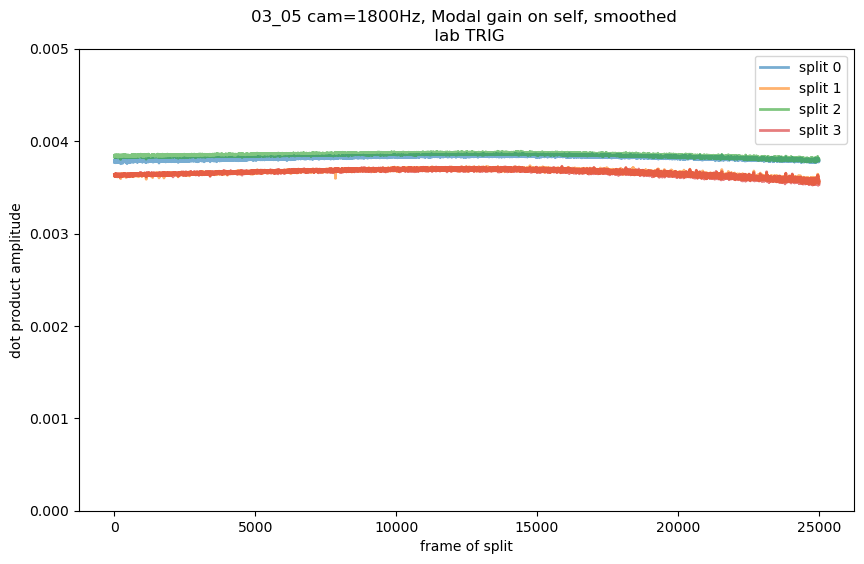

In [174]:
# Dotproduct lab dataset TRIG
fig = plt.figure(figsize=(10,6), facecolor='white')

for e in range(4):
    plt.plot(refsplit1_l_trigg[e], lw=2, alpha = 0.6, label = f'split {e}')
    
plt.legend()
plt.ylim(top=0.005, bottom=0)
plt.xlabel('frame of split')
plt.ylabel('dot product amplitude')
plt.title(f"03_05 cam=1800Hz, Modal gain on self, smoothed \n lab TRIG")
plt.show()

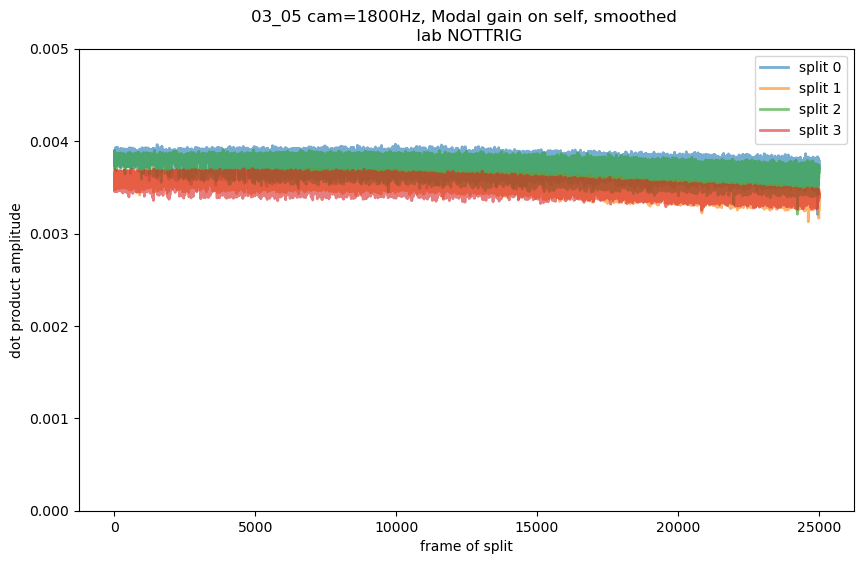

In [173]:
# Dotproduct onsky dataset NOTTRIG
fig = plt.figure(figsize=(10,6), facecolor='white')

for e in range(4):
    plt.plot(refsplit1_l_nottrigg[e], lw=2, alpha = 0.6, label = f'split {e}')
    
plt.legend()
plt.ylim(top=0.005, bottom=0)
plt.xlabel('frame of split')
plt.ylabel('dot product amplitude')
plt.title(f"03_05 cam=1800Hz, Modal gain on self, smoothed \n lab NOTTRIG")
plt.show()

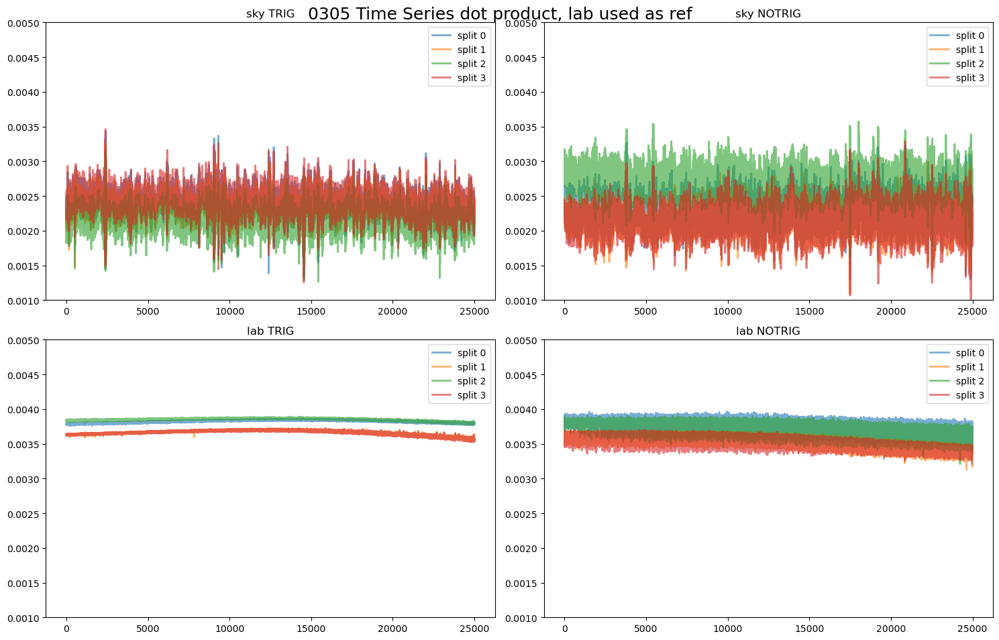

In [170]:
# data Subplots - triggered untriggered raw

# define subplot grid
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 10), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 Time Series dot product, lab used as ref", fontsize=18, y=0.95)

data_sets = [refsplit1_trigg, refsplit1_nottrigg, refsplit1_l_trigg, refsplit1_l_nottrigg]
data_titles = ["sky TRIG", "sky NOTRIG", "lab TRIG", "lab NOTRIG"]

# loop through tickers and axes
for i, ax in zip(range(4), axs.ravel()):
    # filter df for ticker and plot on specified axes
    for e in range(4):
        ax.plot(data_sets[i][e], lw=2, alpha = 0.6, label = f'split {e}')
    # chart formatting
    ax.set_ylim(top=0.005, bottom=0.001)
    ax.set_title(data_titles[i])
    ax.legend()

plt.tight_layout()
plt.show()

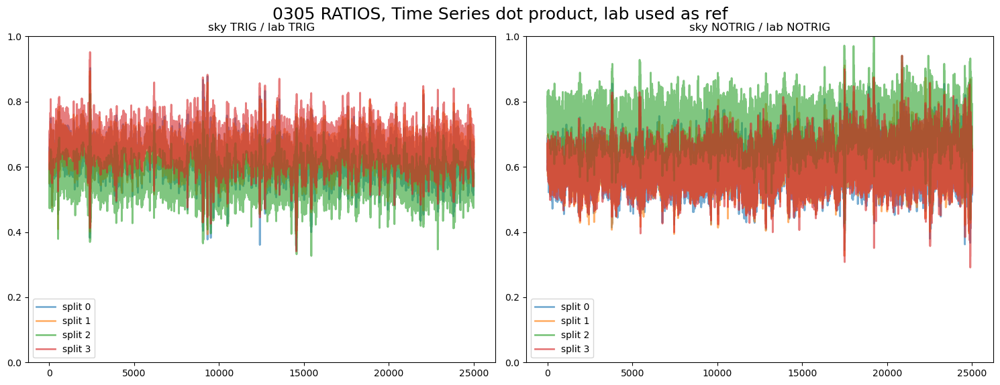

In [172]:
# data Subplots - triggered untriggered ratios

# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 RATIOS, Time Series dot product, lab used as ref", fontsize=18, y=0.95)

data_sets = [refsplit1_trigg, refsplit1_nottrigg, refsplit1_l_trigg, refsplit1_l_nottrigg]
data_titles = ["sky TRIG", "sky NOTRIG", "lab TRIG", "lab NOTRIG"]

# loop through tickers and axes
for i, ax in zip(range(2), axs.ravel()):
    # filter df for ticker and plot on specified axes
    for e in range(4):
        ax.plot(np.divide(data_sets[i][e],data_sets[i+2][e]), lw=2, alpha = 0.6, label = f'split {e}')
    # chart formatting
    ax.set_ylim(top=1, bottom=0)
    ax.set_title(data_titles[i] + " / " + data_titles[i+2])
    ax.legend()

plt.tight_layout()
plt.show()


#### Rotating into a lab frame

- currently, have a, it's the return of the dot code as written
- matrix multiply 4x4 cubes with a 1x4 of the un-normed data
- do the same thing as before, but now in the transformed data

In [30]:
reload(spkl)
sp_test = spkl.Spark(sky_t_dir_0305, lab_t_dir_0305, dir_calib, dark, mask, ref)

=> Sampling 100 files, starting at 0
100
HZ value: 1800
HZ value: 1800


In [31]:
# on sky dot products - with lab as the reference
data_sp_test = np.array(sp_test.dot_list_pool(n=1000, n_workers=40))
test_shape = data_sp_test.shape
x_data_reshaped = np.reshape(data_sp_test, (test_shape[0]//4, 4, 4))
a_coeffs = x_data_reshaped

chunksize=25, n_workers=40


In [88]:
np.sum(a_coeffs, axis = (1,2)).shape

(250,)

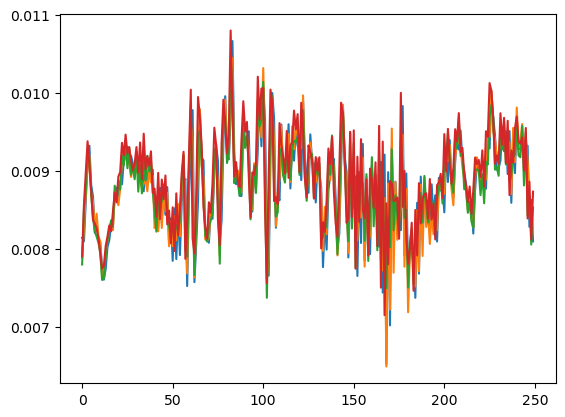

In [87]:
# what are these a matricies?
for i in range(4):
    plt.plot(np.sum(a_coeffs, axis = 2)[:,i] - np.sum(a_coeffs, axis = (1,2)))

In [32]:
x_unnorm = sp_test.file_sample_n_clean(sp_test.dir_data, 1000, norm=False)
x_unnorm_data = np.array([x_un[0] for x_un in x_unnorm]) #taking the data axis here
x_unnorm_reshaped = np.reshape(x_unnorm_data, (x_unnorm_data.shape[0]//4, 4, 120, 120))
x_unnorm_reshaped.shape

=> Sampling 1000 files, starting at 0
1000


(250, 4, 120, 120)

In [33]:
print(a_coeffs.shape)
print(x_unnorm_reshaped.shape)

(250, 4, 4)
(250, 4, 120, 120)


In [61]:
# MATRIX MULTIPLICATION
# multiply coefficieents [n, 4, 4] by the reshaped x_unnorm [n, 4, 120, 120]
sky_lab = np.einsum('nij,njkl->nikl', a_coeffs, x_unnorm_reshaped)
sky_lab.shape

(250, 4, 120, 120)

In [62]:
# write the SLOW for loop that the einsum does to confirm the numbers
sky_lab_slow = []
for e, split in enumerate(x_unnorm_reshaped):
    # Now we're in the single split of [4, 120, 120] for the file and [4,4]
    si_mid = []
    for si in a_coeffs[e]:
        rot_img = np.zeros_like(split[0])
        for i in range(4):
            rot_img =+ split[i]*si[i]
        si_mid.append(rot_img)
    sky_lab_slow.append(si_mid)
sky_lab_slow = np.array(sky_lab_slow)
sky_lab_slow.shape

(250, 4, 120, 120)

In [64]:
# reshape to the single list of files, like the original data files
sky_lab_reshape = np.reshape(x_unnorm_data, (sky_lab.shape[0]*4, 120, 120))
sky_lab_slow_reshape = np.reshape(x_unnorm_data, (sky_lab_slow.shape[0]*4, 120, 120))
# dot product all of that data
dot_labref_4way = np.array([sp_test.dot_data(sky_lab_i) for sky_lab_i in sky_lab_reshape])
dot_labref_slow_4way = np.array([sp_test.dot_data(sky_lab_i) for sky_lab_i in sky_lab_slow_reshape])

In [66]:
print(dot_labref_4way[0::4].shape)
print(dot_labref_slow_4way[0::4].shape)

(250, 4)
(250, 4)


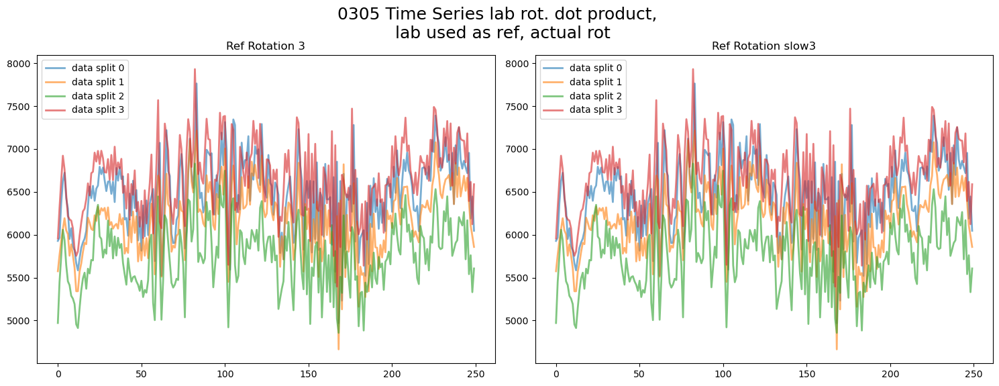

In [69]:
# Lab rotated plots, each roll

# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 Time Series lab rot. dot product, \n lab used as ref, actual rot", fontsize=18, y=0.95)

# loop through tickers and axes
    # filter df for ticker and plot on specified axes
for e in range(4):
    axs[0].plot(dot_labref_4way[e::4][:,(e)%4], lw=2, alpha = 0.6, label = f'data split {e}')
# chart formatting
#ax[0].set_ylim(top=100, bottom=0)
axs[0].set_title(f"Ref Rotation {i}")
axs[0].legend()

for e in range(4):
    axs[1].plot(dot_labref_slow_4way[e::4][:,(e)%4], lw=2, alpha = 0.6, label = f'data split {e}')
# chart formatting
#ax[1].set_ylim(top=100, bottom=0)
axs[1].set_title(f"Ref Rotation slow{i}")
axs[1].legend()


plt.tight_layout()
plt.show()

In [59]:
# now checking out this value for lab data:
y_unnorm = sp_test.file_sample_n_clean(sp_test.dir_lab, 250, norm=False)
y_unnorm_data = np.array([y_un[0] for y_un in y_unnorm]) #taking the data axis here

=> Sampling 250 files, starting at 0
250


In [60]:
y_dot_labref_4way = np.array([sp_test.dot_data(y_un) for y_un in y_unnorm_data])

In [ ]:
y_ref_avg = []

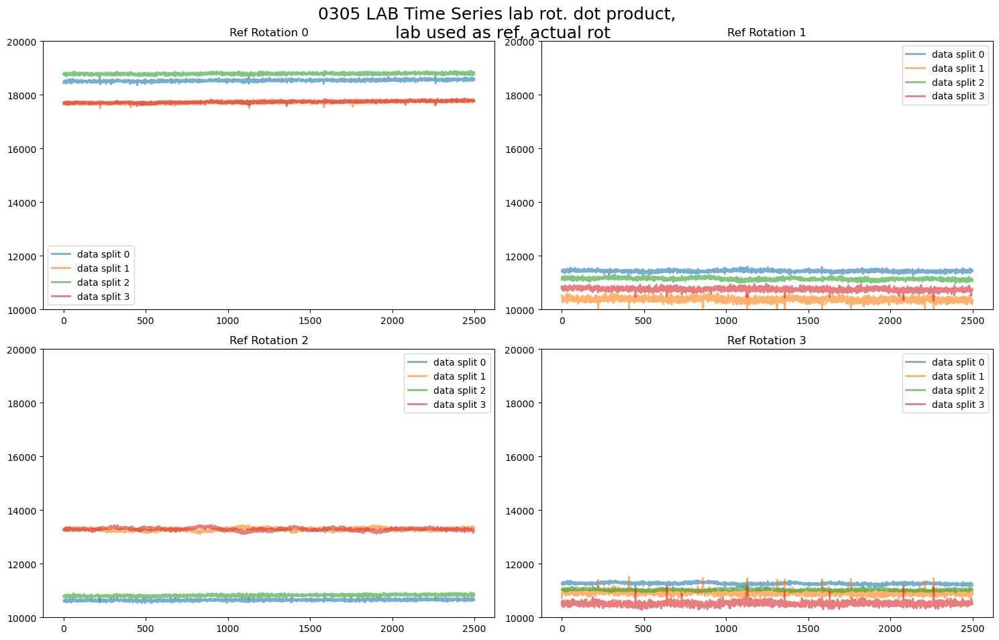

In [56]:
# Lab rotated plots, each roll

# define subplot grid
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 10), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 LAB Time Series lab rot. dot product, \n lab used as ref, actual rot", fontsize=18, y=0.95)

# loop through tickers and axes
for i, ax in zip(range(4), axs.ravel()):
    # filter df for ticker and plot on specified axes
    for e in range(4):
        ax.plot(y_dot_labref_4way[e::4][:,(e+i)%4], lw=2, alpha = 0.6, label = f'data split {e}')
    # chart formatting
    ax.set_ylim(top=20000, bottom=10000)
    ax.set_title(f"Ref Rotation {i}")
    ax.legend()

plt.tight_layout()
plt.show()

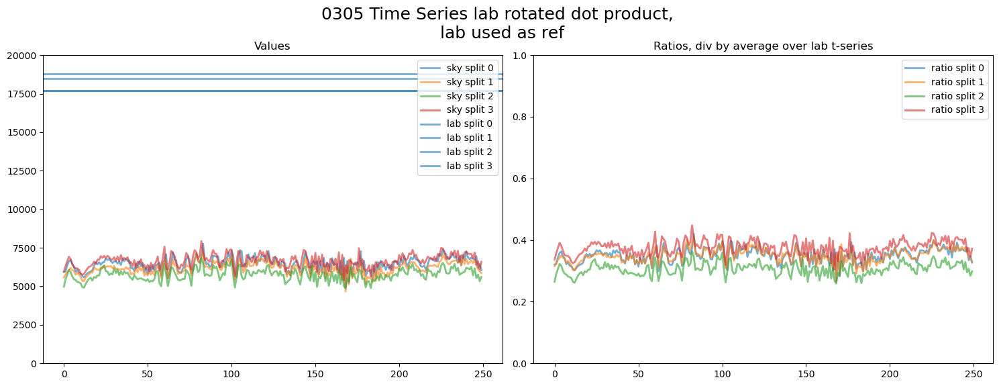

In [78]:
# Both datasets, same plot

# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 Time Series lab rotated dot product, \n lab used as ref", fontsize=18, y=0.95)

axs_r = axs.ravel()

# plot raw values
for e in range(4):
    axs_r[0].plot(dot_labref_4way[e::4][:,(e)%4], lw=2, alpha = 0.6, label = f'sky split {e}')
for e in range(4):
    axs_r[0].axhline(np.average(y_dot_labref_4way[e::4][:,e], axis = 0), lw=2, alpha = 0.6, label = f'lab split {e}')
# chart formatting
axs_r[0].set_ylim(top=20000, bottom=0)
axs_r[0].set_title(f"Values")
axs_r[0].legend()

# plot ratios
for e in range(4):
    axs_r[1].plot(dot_labref_4way[e::4][:,(e)%4]/ np.average(y_dot_labref_4way[e::4][:,(e)%4]), lw=2, alpha = 0.6, label = f'ratio split {e}')
# chart formatting
axs_r[1].set_ylim(top=1, bottom=0)
axs_r[1].set_title(f"Ratios, div by average over lab t-series")
axs_r[1].legend()

plt.tight_layout()
plt.show()


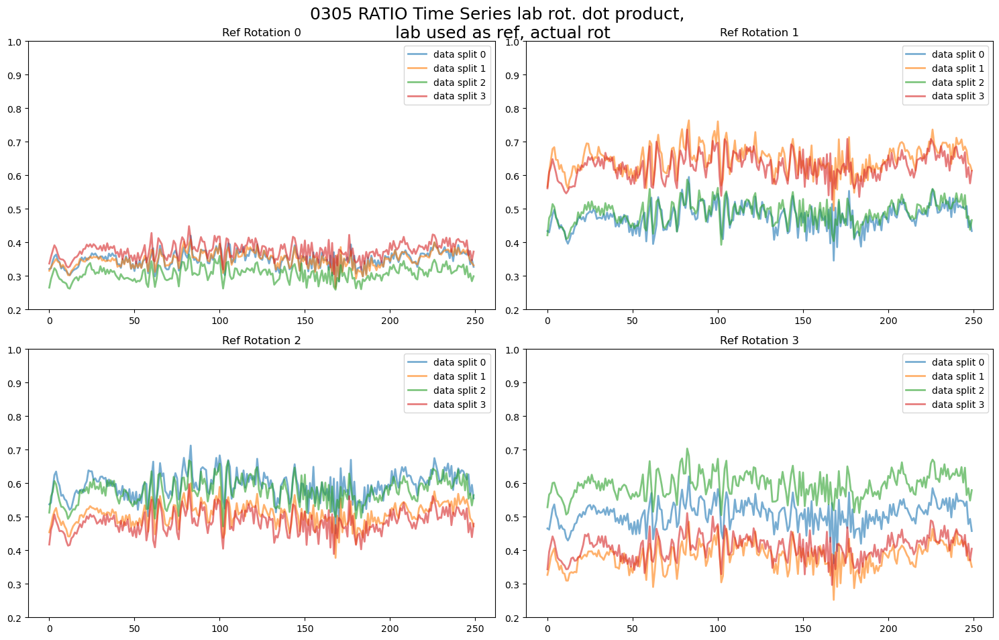

In [76]:
# Lab rotated plots, each roll

# define subplot grid
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 10), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 RATIO Time Series lab rot. dot product, \n lab used as ref, actual rot", fontsize=18, y=0.95)

# loop through tickers and axes
for i, ax in zip(range(4), axs.ravel()):
    # filter df for ticker and plot on specified axes
    for e in range(4):
        ax.plot(dot_labref_4way[e::4][:,(e+i)%4] / np.average(y_dot_labref_4way[e::4][:,(e+i)%4]), lw=2, alpha = 0.6, label = f'data split {e}')
    # chart formatting
    ax.set_ylim(top=1, bottom=0.2)
    ax.set_title(f"Ref Rotation {i}")
    ax.legend()

plt.tight_layout()
plt.show()

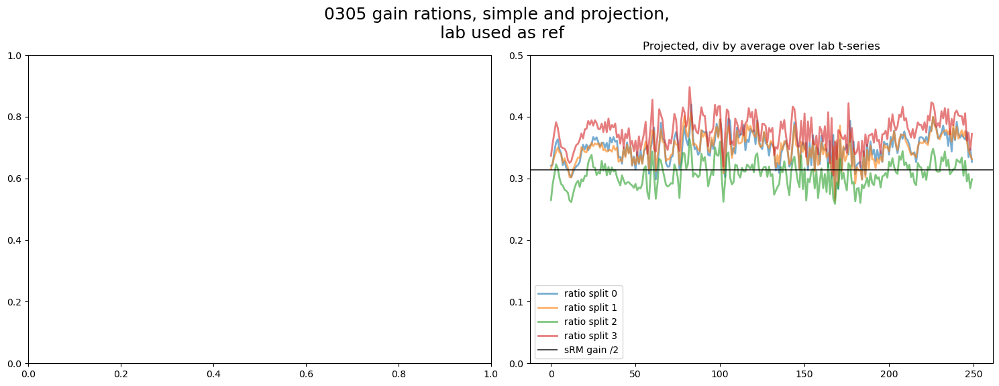

In [74]:
#PLOT: compare basis set with projection set

# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 gain rations, simple and projection, \n lab used as ref", fontsize=18, y=0.95)

axs_r = axs.ravel()

# plot raw values
for e in range(4):
    axs_r[0].plot(refsplit1_trigg[e]/refsplit1_l_trigg[e], lw=2, alpha = 0.6, label = f'ratio split {e}')
# chart formatting
axs_r[0].axhline(average_sRM_gain_t, alpha=0.7, label="sRM gain", color="black")
axs_r[0].set_ylim(top=1, bottom=0)
axs_r[0].set_title(f"Simple")
axs_r[0].legend()

# plot ratios compicated
for e in range(4):
    axs_r[1].plot(dot_labref_4way[e::4][:,e]/ np.average(y_dot_labref_4way[e::4][:,e]), lw=2, alpha = 0.6, label = f'ratio split {e}')
# chart formatting
axs_r[1].axhline(average_sRM_gain_t/2, alpha=0.7, label="sRM gain /2", color="black")
axs_r[1].set_ylim(top=0.5, bottom=0)
axs_r[1].set_title(f"Projected, div by average over lab t-series")
axs_r[1].legend()

plt.tight_layout()
plt.show()



In [186]:
# Projection splits
proj_split_sky = [dot_labref_4way[i::4,i] for i in range(4)]
proj_split_lab = [y_dot_labref_4way[i::4,i] for i in range(4)]

In [189]:
avg_trigg = np.average(np.divide(refsplit1_trigg,refsplit1_l_trigg), axis=0)
avg_trigg_lab = np.average(np.divide(proj_split_sky,proj_split_lab), axis=0)


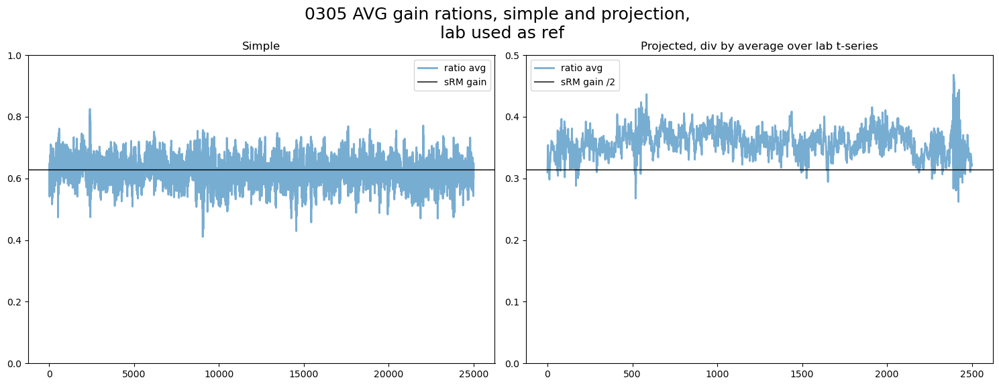

In [191]:
#PLOT: compare basis set with projection set

# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
fig.suptitle("0305 AVG gain rations, simple and projection, \n lab used as ref", fontsize=18, y=0.95)

axs_r = axs.ravel()

axs_r[0].plot(avg_trigg, lw=2, alpha = 0.6, label = f'ratio avg')
# chart formatting
axs_r[0].axhline(average_sRM_gain_t, alpha=0.7, label="sRM gain", color="black")
axs_r[0].set_ylim(top=1, bottom=0)
axs_r[0].set_title(f"Simple")
axs_r[0].legend()


axs_r[1].plot(avg_trigg_lab, lw=2, alpha = 0.6, label = f'ratio avg')
# chart formatting
axs_r[1].axhline(average_sRM_gain_t/2, alpha=0.7, label="sRM gain /2", color="black")
axs_r[1].set_ylim(top=0.5, bottom=0)
axs_r[1].set_title(f"Projected, div by average over lab t-series")
axs_r[1].legend()

plt.tight_layout()
plt.show()



# March 7 Beta pic dataset
is there a signal to noise ratio problem with speckles

In [3]:
# data - sky
sky_t_dir_0307 = "/home/eden/data/2023A/03_07_spark_BetaPic/camwfs/"
# data - lab
lab_t_dir_0308 = "/home/eden/data/2023A/03_08_sparkles_selfRM_1800/camwfs/"
lab_dir_0307 = "/home/eden/data/2023A/LAB/lab_1800_sparkles_1Hz_amp020_sep20/camwfs/"

## 03_07 self_RMs

In [4]:
# New Self-RMs
RM_dir = "/home/eden/data/self_RMs/"
self_RM = os.listdir(RM_dir)

In [5]:
# pulling and naming files
selfRM_data_0307 = fits.open(RM_dir + 'selfRM_20230305_06_betaPic_sparkles_triggered.fits')[0].data
print("data spark sky: ", self_RM[-4])
selfRM_lab_0307 = fits.open(RM_dir + 'selfRM_LAB_20230308_20_002.fits')[0].data
print("data spark lab: ", self_RM[-1])

data spark sky:  selfRM_20230311_12_LAB_spark_1200_020amps_20seps.fits
data spark lab:  selfRM_20230311_12_LAB_spark_1800_050amps_20seps.fits


In [21]:
gain_series_0307 = np.diag(selfRM_data_0307[5])/np.diag(selfRM_lab_0307[5])

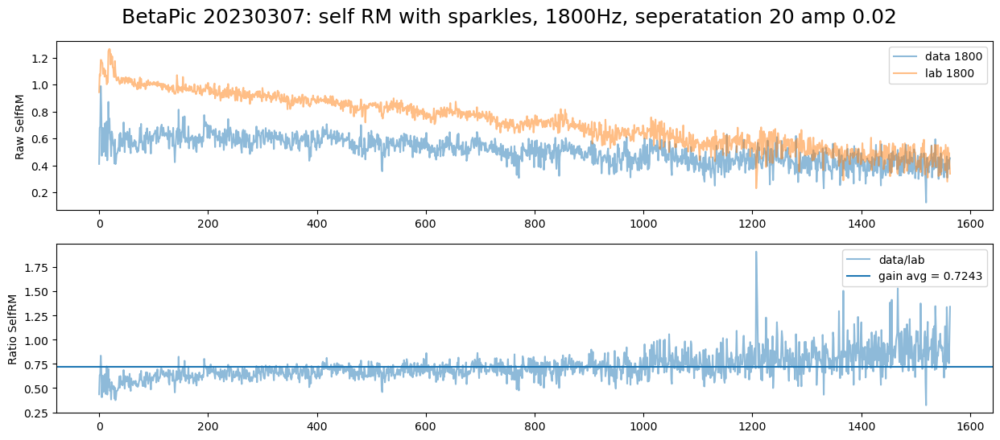

In [36]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 6), facecolor='white')
fig.suptitle("BetaPic 20230307: self RM with sparkles, 1800Hz, seperatation 20 amp 0.02", fontsize=18, y=0.95)

axs[0].set_ylabel("Raw SelfRM")
axs[0].plot(np.diag(selfRM_data_0307[5]), label="data 1800", alpha=0.5)
axs[0].plot(np.diag(selfRM_lab_0307[5]), label="lab 1800", alpha=0.5)
axs[0].legend()

axs[1].set_ylabel("Ratio SelfRM")
axs[1].plot(np.diag(selfRM_data_0307[5])/np.diag(selfRM_lab_0307[5]), label="data/lab", alpha=0.5)
gain_avg_07 = np.average(np.diag(selfRM_data_0307[5])/np.diag(selfRM_lab_0307[5]))
axs[1].axhline(gain_avg_07, label=f"gain avg = {gain_avg_07:0.4f}")
axs[1].legend()
plt.show()


## 03_07 WFS data

In [64]:
# create sparkle object
reload(spkl)

# Sky sparkles
sp_sky_0307 = spkl.Spark(sky_t_dir_0307, lab_t_dir_0308, dir_calib, dark, mask, ref)
sp_sky_0307.set_spark_params()
sp_lab_0308 = spkl.Spark(lab_t_dir_0308, lab_t_dir_0308, dir_calib, dark, mask, ref)
sp_lab_0308.set_spark_params()

=> Sampling 100 files, starting at 0
100
HZ value: 1800
HZ value: 1800
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
=> Sampling 100 files, starting at 0
100
HZ value: 1800
HZ value: 1800
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  


In [39]:
# lab split
data_split_l_0308 = np.array(spkl.split_data_roll(np.array(sp_lab_0308.dot_list_pool(n=100000, n_workers=60))))
data_split_s_0307 = np.array(spkl.split_data_roll(np.array(sp_sky_0307.dot_list_pool(n=100000, n_workers=60))))

chunksize=1667, n_workers=60
chunksize=1667, n_workers=60


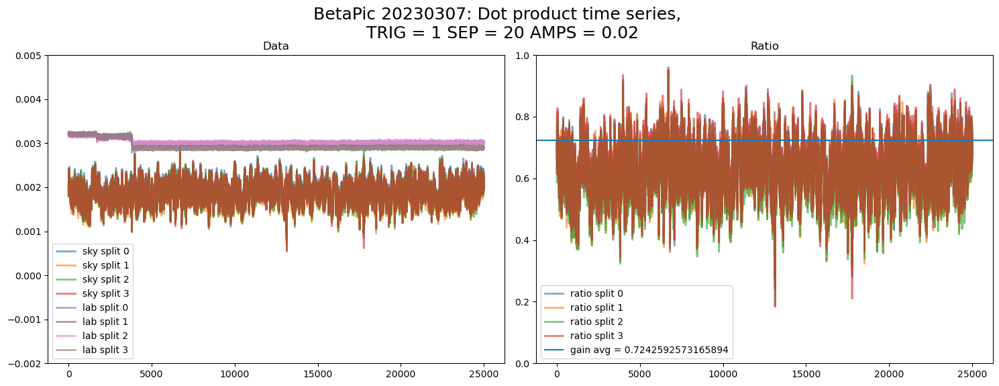

In [40]:
# Both datasets, same plot
# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
title_long = f"BetaPic 20230307: Dot product time series, \n TRIG = {sp_sky_0307.data_spark_params['TRIG']} SEP = {sp_sky_0307.data_spark_params['SEPS']} AMPS = {sp_sky_0307.lab_spark_params['AMPS']}"
fig.suptitle(title_long, fontsize=18, y=0.95)

axs_r = axs.ravel()

# plot raw values
for e in range(4):
    axs_r[0].plot(data_split_s_0307[e], lw=2, alpha = 0.6, label = f'sky split {e}')
for e in range(4):
    axs_r[0].plot(data_split_l_0308[e], lw=2, alpha = 0.6, label = f'lab split {e}')
# chart formatting
axs_r[0].set_ylim(top=0.005, bottom=-0.002)
axs_r[0].set_title(f"Data")
axs_r[0].legend()

# plot ratios
for e in range(4):
    axs_r[1].plot(data_split_s_0307[e]/np.average(data_split_l_0308[e]), lw=2, alpha = 0.6, label = f'ratio split {e}')

# chart formatting
axs_r[1].set_ylim(top=1, bottom=0.00)
axs[1].axhline(gain_avg_07, label=f"gain avg = {gain_avg_07}")
axs_r[1].set_title(f"Ratio")
axs_r[1].legend()

plt.tight_layout()
plt.show()

In [44]:
# calc averages
avg_gain_0307 = np.average([data_split_t/np.average(data_split_l_0308[e]) for e, data_split_t in enumerate(data_split_s_0307)], axis=0)


In [53]:
avg_smoothed_gain_0307, avg_std_gain_0307 = return_rolling(avg_gain_0307, n=450)

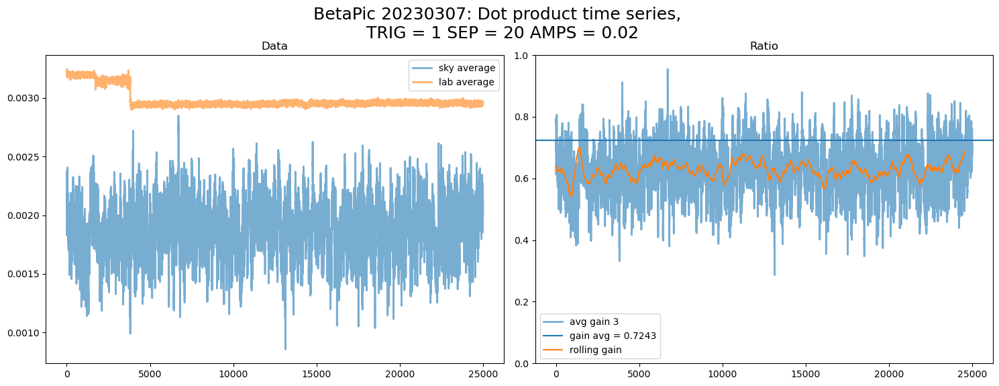

In [56]:
# averages


# Both datasets, same plot
# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
title_long = f"BetaPic 20230307: Dot product time series, \n TRIG = {sp_sky_0307.data_spark_params['TRIG']} SEP = {sp_sky_0307.data_spark_params['SEPS']} AMPS = {sp_sky_0307.lab_spark_params['AMPS']}"
fig.suptitle(title_long, fontsize=18, y=0.95)

axs_r = axs.ravel()

# plot raw values
axs_r[0].plot(np.average(data_split_s_0307, axis=0), lw=2, alpha = 0.6, label = f'sky average')
axs_r[0].plot(np.average(data_split_l_0308, axis=0), lw=2, alpha = 0.6, label = f'lab average')
# chart formatting
#axs_r[0].set_ylim(top=0.005, bottom=-0.002)
axs_r[0].set_title(f"Data")
axs_r[0].legend()

# plot ratios
axs_r[1].plot(avg_gain_0307, lw=2, alpha = 0.6, label = f'avg gain {e}')
axs_r[1].axhline(gain_avg_07, label=f"gain avg = {gain_avg_07:0.4f}")
axs_r[1].plot(avg_smoothed_gain_0307, label="rolling gain")
# chart formatting
axs_r[1].set_ylim(top=1, bottom=0.00)
axs_r[1].set_title(f"Ratio")
axs_r[1].legend()

plt.tight_layout()
plt.show()

### Checking longterm Data averages:

To do this, we need to work on chunking this dataset

In [65]:
f_list_0307 = sp_sky_0307.file_lister(sp_sky_0307.dir_data)
print(len(f_list_0307))

4278807


In [59]:
# iterate through all the files, and check which ones break the system

def check_file(file, path):
    f_all = path + file
    if not os.path.isfile(f_all):
        print(f"WARNING! {file} not found")
        return False
    try:
        with fits.open(f_all) as hdul:
            hdul.close()
            return True
    except Exception as e:
        print(f"WARNING! {file} not found")
        print(f"{e}")
        return False

In [66]:
# what makes a mintue of data:
dir_data = sp_sky_0307.dir_data
data_splits_list = []

for n in range(len(f_list_0307)//(1800*60)):
    ni = n*1800*60
    print(f"START: Block {n} starting with file {ni}!")
    try:
        data_split_s_0307 = np.array(spkl.split_data_roll(np.array(sp_sky_0307.dot_list_pool(n_start=ni, n=1800*60, n_workers=60))))
        data_splits_list.append(data_split_s_0307)
    except Exception as e:
        print(f"We had an error at file {ni}!")
        continue
    print(f"=> END: Block {n}")

# make sure to save this result!
np.save("./saves/data_splits_list_0307.npy", data_splits_list)


START: Block 0 starting with file 0!
chunksize=1800, n_workers=60
=> END: Block 0
START: Block 1 starting with file 108000!
chunksize=1800, n_workers=60
=> END: Block 1
START: Block 2 starting with file 216000!
chunksize=1800, n_workers=60
=> END: Block 2
START: Block 3 starting with file 324000!
chunksize=1800, n_workers=60
=> END: Block 3
START: Block 4 starting with file 432000!
chunksize=1800, n_workers=60
=> END: Block 4
START: Block 5 starting with file 540000!
chunksize=1800, n_workers=60
=> END: Block 5
START: Block 6 starting with file 648000!
chunksize=1800, n_workers=60
=> END: Block 6
START: Block 7 starting with file 756000!
chunksize=1800, n_workers=60
=> END: Block 7
START: Block 8 starting with file 864000!
chunksize=1800, n_workers=60
=> END: Block 8
START: Block 9 starting with file 972000!
chunksize=1800, n_workers=60
=> END: Block 9
START: Block 10 starting with file 1080000!
chunksize=1800, n_workers=60
=> END: Block 10
START: Block 11 starting with file 1188000!
c

In [67]:
# make sure to save this result!
np.save("./saves/data_splits_list_0307.npy", data_splits_list)

In [129]:
data_splits_list_0307 = np.load("./saves/data_splits_list_0307.npy")

In [82]:
len(data_splits_list_0307)

NameError: name 'data_splits_list_0307' is not defined

In [130]:
# now we want to stack this 
data_splits_stack_0307 = np.hstack(data_splits_list_0307)
data_splits_stack_0307.shape

(4, 1053000)

In [131]:
avg_lab = np.average(data_split_l_0308[:80], axis=1)
avg_lab.shape

(4,)

In [133]:
avg_gain_0307_long = np.average([data_split_t/avg_lab[e] for e, data_split_t in enumerate(data_splits_stack_0307)], axis=0)
avg_smoothed_gain_0307_long, avg_std_gain_0307_long = spkl.return_rolling(avg_gain_0307_long, n=450)

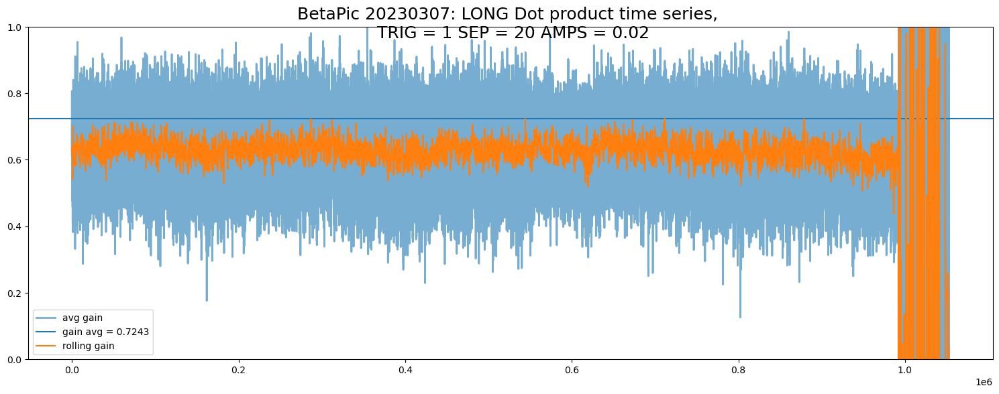

In [75]:
# plot all time
# Both datasets, same plot
# define subplot grid
fig = plt.figure(figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
title_long = f"BetaPic 20230307: LONG Dot product time series, \n TRIG = {sp_sky_0307.data_spark_params['TRIG']} SEP = {sp_sky_0307.data_spark_params['SEPS']} AMPS = {sp_sky_0307.lab_spark_params['AMPS']}"
plt.title(title_long, fontsize=18, y=0.95)

# plot ratios
plt.plot(avg_gain_0307_long, lw=2, alpha = 0.6, label = f'avg gain')
plt.axhline(gain_avg_07, label=f"gain avg = {gain_avg_07:0.4f}")
plt.plot(avg_smoothed_gain_0307_long, label="rolling gain")
# chart formatting
plt.ylim(top=1, bottom=0.00)
plt.legend()

plt.tight_layout()
plt.show()

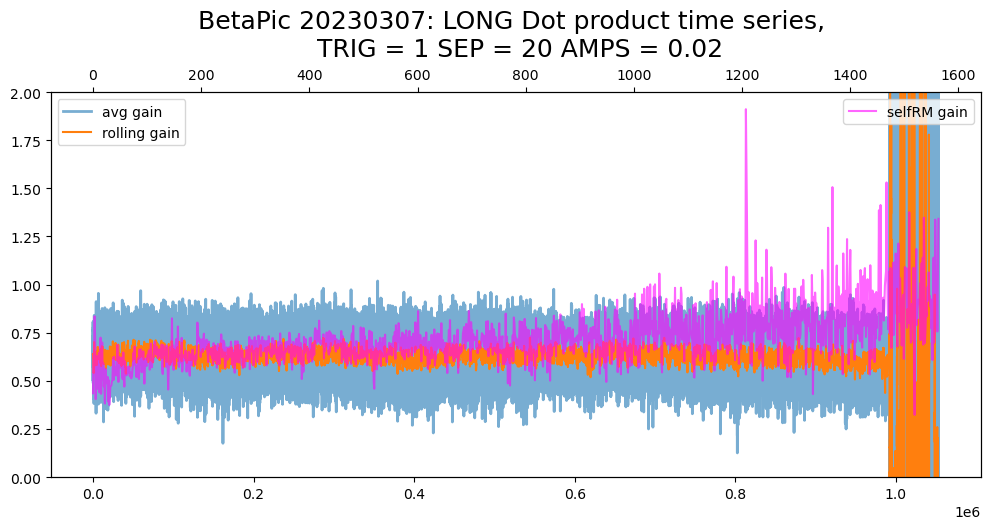

In [137]:
# plot all time
# Both datasets, same plot
# define subplot grid
fig, ax  = plt.subplots(figsize=(12, 5), facecolor='white')
fig.subplots_adjust(hspace=0.5)
title_long = f"BetaPic 20230307: LONG Dot product time series, \n TRIG = {sp_sky_0308.data_spark_params['TRIG']} SEP = {sp_sky_0308.data_spark_params['SEPS']} AMPS = {sp_sky_0308.lab_spark_params['AMPS']}"
ax.set_title(title_long, fontsize=18, y=0.95, pad=40)

# plot ratios
ax.plot(avg_gain_0307_long, lw=2, alpha = 0.6, label = f'avg gain')
#ax.axhline(gain_avg_03_08, label=f"gain avg = {gain_avg_03_08:0.4f}")
#ax.axhline(gain_avg_03_08_lo, label=f"lo gain avg = {gain_avg_03_08_lo:0.4f}")
ax2 = ax.twiny()
ax2.plot(gain_series_0307, alpha = 0.6, color = 'magenta', label='selfRM gain')
ax.plot(avg_smoothed_gain_0307_long, label="rolling gain")

# chart formatting
ax.set_ylim(top=2, bottom=0.00)
ax.legend()
ax2.legend()

fig.show()

### Checking average dot products

In [7]:
avg_dot_file = sky_t_dir_0307.replace('camwfs/', "data_chunks_list.npy")
avg_dot_03_07 = np.vstack(np.load(avg_dot_file))
avg_dot_03_07.shape

(2340, 4, 4)

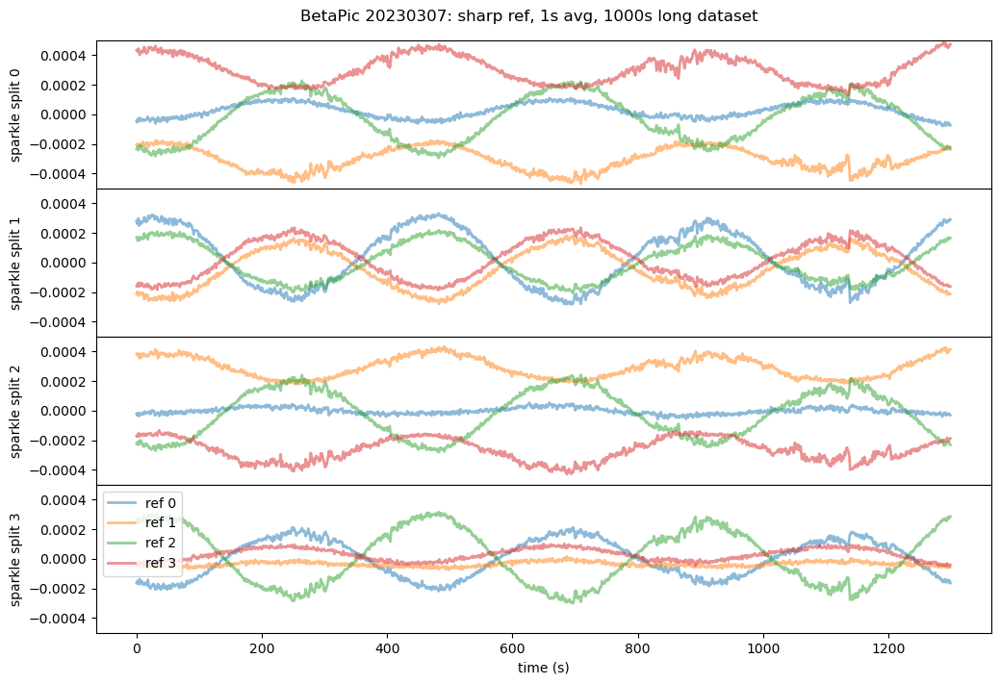

In [8]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230307: sharp ref, 1s avg, 1000s long dataset", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(avg_dot_03_07[:1300,e,i], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    axs[e].set_ylim(top=.0005, bottom=-0.0005)

plt.legend()
plt.xlabel('time (s)')
plt.show()

#### testing sinusoidal fits

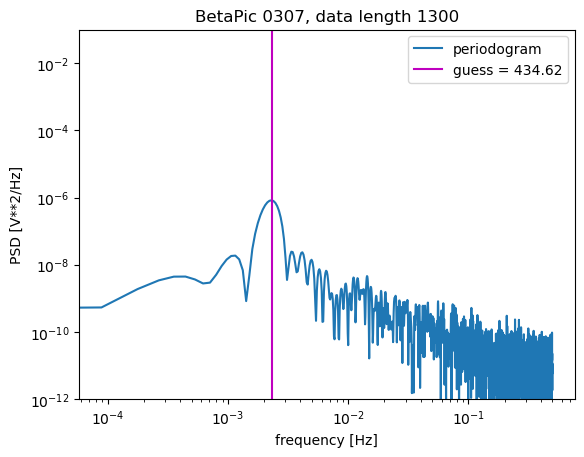

In [9]:
import curve_fits as cf
reload(cf)

x_start = 0
x_end = 1300

y_data = avg_dot_03_07[x_start:x_end,0,1]
max_f = cf.find_freq(y_data, title=f"BetaPic 0307, data length {x_end-x_start}")

[ 1.05292051e-04  1.11791864e+00 -3.05527641e-04]


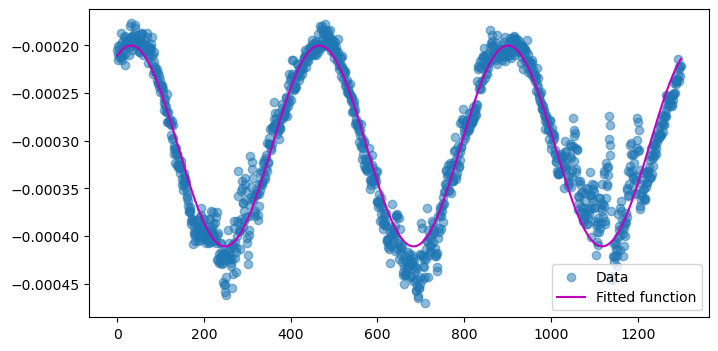

array([ 1.05292051e-04,  1.11791864e+00, -3.05527641e-04])

In [10]:
reload(cf)
# simple one dimension fit
cf.simple_fit(x_start, x_end, avg_dot_03_07[:,0,1])

In [11]:
# windowing fit:
reload(cf)
sin_fits, sin_std = cf.window_fit(avg_dot_03_07[:1500,0,3], 500)

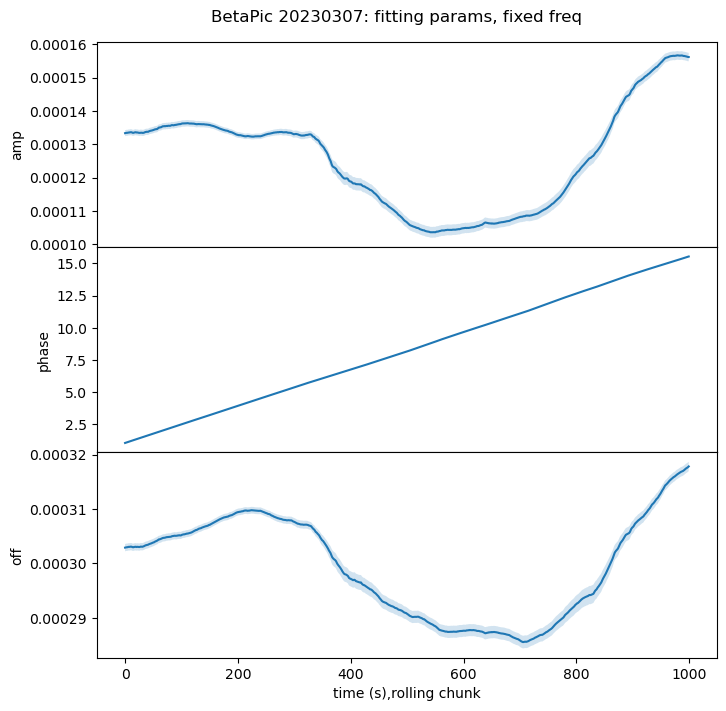

In [12]:
# Redid the ref code, now checking the series
reload(cf)

cf.plot_fits(sin_fits, sin_std, "BetaPic 20230307: ")

In [13]:
# trying to fit all the data
reload(cf)
fits_all = cf.window_fits_all(0, 1300, avg_dot_03_07, 500)
fits_all.shape

(4, 4, 800, 3)

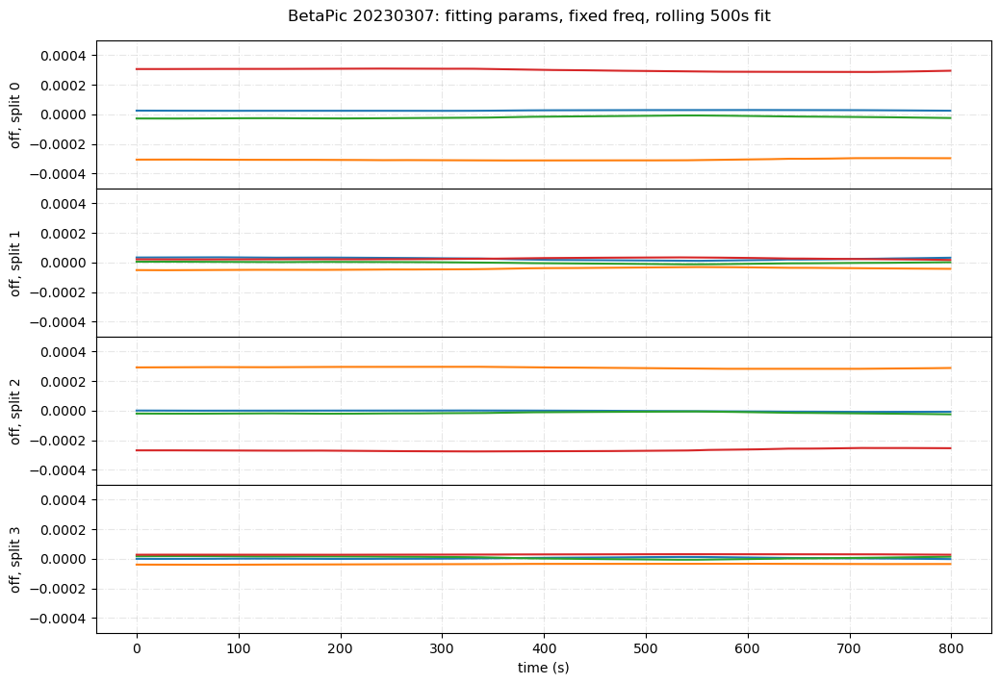

In [14]:
# todo: make the gains plots
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle("BetaPic 20230307: fitting params, fixed freq, rolling 500s fit", y=0.92)

param_names = ["amp", "phase", "off"]

for e in range(4):
    axs[e].plot(fits_all[e,:,:,2].T)
    axs[e].set_ylabel( f"{param_names[2]}, split {e}")
    axs[e].set_ylim(top=.0005, bottom=-0.0005)
    axs[e].grid(linestyle='-.', alpha=0.3)

#plt.legend()
plt.xlabel('time (s)')
plt.show()

In [15]:
# loading the relevant lab data
lab_dotseries_f = lab_dir_0307.replace("camwfs/", "lab_splits_total_list.npy")
dot_series = np.load(lab_dotseries_f)

HZ value: 1800


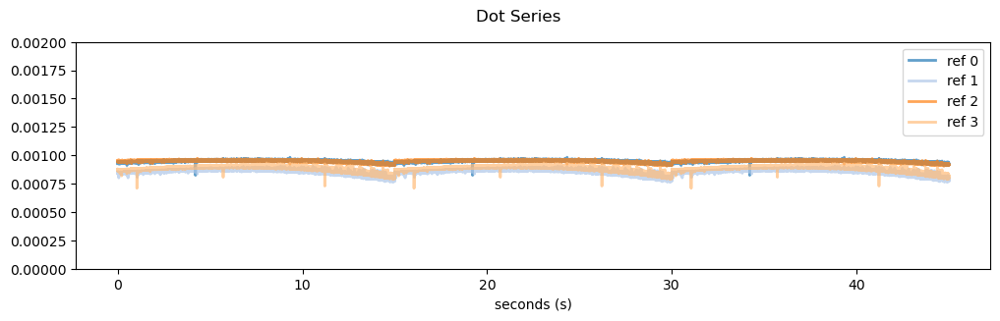

In [16]:
reload(spkl)
spkl.plot_dotseries_diag(dot_series,lab_dir_0307, ylim_top=0.002)

In [17]:
# loading the relevant lab data
lab_dotseries_f = lab_dir_0307.replace("camwfs/", "lab_splits_total_list.npy")
dot_series = np.load(lab_dotseries_f)
lab_averages = [np.mean(dot_series[e::4,e]) for e in range(4)]

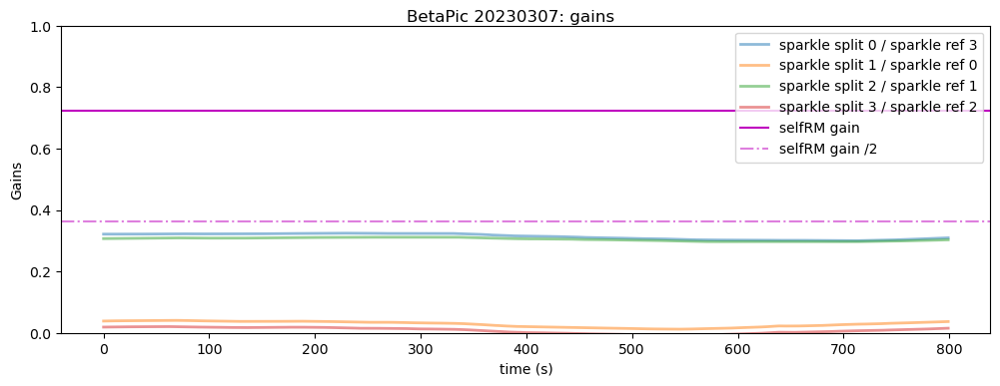

In [31]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,4), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230307: gains", y=0.92)

for i in range(4):
    axs.plot(fits_all[i,(i+3)%4,:,2].T / lab_averages[i], lw=2, alpha = 0.5, label = f"sparkle split {i} / sparkle ref {(i+3)%4}")


axs.set_ylim(top=1, bottom=0.000)

axs.set_ylabel("Gains")

plt.axhline(np.average(gain_series_0307), linestyle='-',c="m", label='selfRM gain')
plt.axhline(np.average(gain_series_0307)/2, linestyle='-.', c="m", label='selfRM gain /2', alpha = 0.5)

plt.legend()
plt.xlabel('time (s)')
plt.show()

In [81]:
# now pulling in the lab fits
# knowing the lab directory, gives us the name of the lab data dot product

# March 8 Beta pic dataset
is there a signal to noise ratio problem with speckles

In [5]:
# data - sky
sky_t_dir_0308 = "/home/eden/data/2023A/03_08_spark_BetaPic/camwfs/"
# data - lab
lab_t_dir_0308 = "/home/eden/data/2023A/LAB/lab_1800_sparkles_1Hz_amp020_sep20/camwfs/"

## 03_08 Self RM gains

In [14]:
# New Self-RMs
RM_dir = "/home/eden/data/2023A/self_RMs/"

In [18]:
# pulling and naming files
data_file = RM_dir + 'selfRM_20230307_08_betaPic_sparkles_trigger_sep20_amp02.fits'
selfRM_data_0308 = fits.open(data_file)[0].data
selfRM_data_0308_DT = fits.open(data_file)[0].header['DATE']
#print("data spark sky: ", selfRM_data_0308)
selfRM_lab_0307 = fits.open(RM_dir + 'selfRM_20230307_08_lab_sparkles_sep20_amp002.fits')[0].data
#print("data spark lab: ", selfRM_lab_0307)

In [19]:
gain_avg_03_08 = np.average(np.diag(selfRM_data_0308[5])/np.diag(selfRM_lab_0307[5]))
gain_series_0308 = np.diag(selfRM_data_0308[5])/np.diag(selfRM_lab_0307[5])

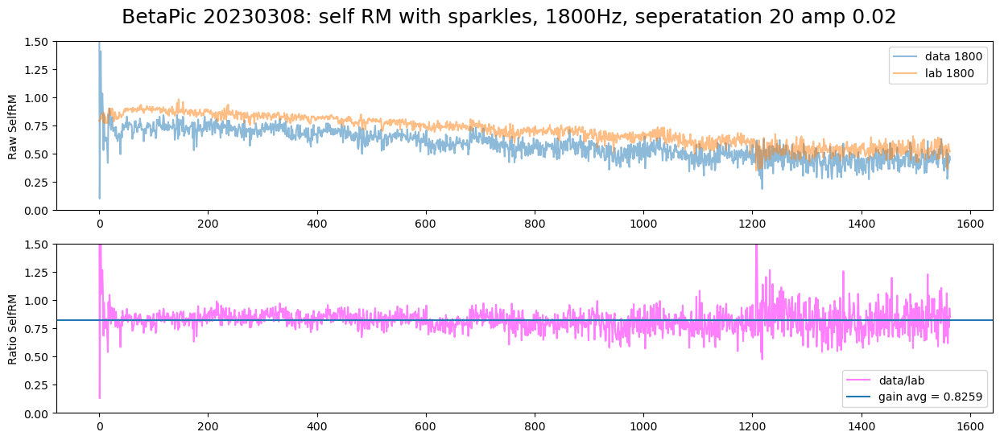

In [15]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 6), facecolor='white')
fig.suptitle("BetaPic 20230308: self RM with sparkles, 1800Hz, seperatation 20 amp 0.02", fontsize=18, y=0.95)

axs[0].set_ylabel("Raw SelfRM")
axs[0].plot(np.diag(selfRM_data_0308[5]), label="data 1800", alpha=0.5)
axs[0].plot(np.diag(selfRM_lab_0307[5]), label="lab 1800", alpha=0.5)
axs[0].set_ylim(top=1.5, bottom=0)
axs[0].legend()

axs[1].set_ylabel("Ratio SelfRM")
axs[1].plot(np.diag(selfRM_data_0308[5])/np.diag(selfRM_lab_0307[5]), c='magenta', label="data/lab", alpha=0.5)
axs[1].axhline(gain_avg_03_08, label=f"gain avg = {gain_avg_03_08:0.4f}")
axs[1].set_ylim(top=1.5, bottom=0)
axs[1].legend()
plt.show()


## 03_08 WFS data

In [8]:
# create sparkle object
reload(spkl)
# Sky sparkles
sp_sky_0308 = spkl.Spark(sky_t_dir_0308, lab_t_dir_0308, dir_calib, dark, mask, ref)
# lab split
sp_lab_0308 = spkl.Spark(lab_t_dir_0308, lab_t_dir_0308, dir_calib, dark, mask, ref, ref_norm = True)

HZ value: 1800
HZ value: 1800
Number of DATA files:  8621567
Number of REF files:  121994
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0
100
HZ value: 1800
HZ value: 1800
Number of DATA files:  121994
Number of REF files:  121994
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0
100


In [43]:
# lab split
sp_lab_0308 = spkl.Spark(lab_t_dir_0308, lab_t_dir_0308, dir_calib, dark, mask, ref, ref_norm = True)

HZ value: 1800
HZ value: 1800
Number of DATA files:  121994
Number of REF files:  121994
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0
100


In [109]:
# dot product lab
data_split_l_0308 = np.array(spkl.split_data_roll(np.array(sp_lab_0308.dot_list_pool(n=1000, n_workers=60))))

chunksize=1667, n_workers=60


### checking ref wfs

In [9]:
# rewrote the ref generation
reload(spkl)
sp_sky_0308 = spkl.Spark(sky_t_dir_0308, lab_t_dir_0308, dir_calib, dark, mask, ref)

IndexError: list index out of range

In [182]:
# trying a dotproduct with an average
avg_dot = sp_sky_0308.dot_chunk_pool(450, 100, n_workers=10)

processing from file 0 to 180000, Chunk size 1800 for 100 tasks
=> Sampling 1800 files, starting at 0
=> Sampling 1800 files, starting at 18000
=> Sampling 1800 files, starting at 36000
=> Sampling 1800 files, starting at 54000
=> Sampling 1800 files, starting at 72000=> Sampling 1800 files, starting at 90000

=> Sampling 1800 files, starting at 108000
=> Sampling 1800 files, starting at 126000
=> Sampling 1800 files, starting at 144000=> Sampling 1800 files, starting at 162000

chunksize=10, n_workers=10
=> Sampling 1800 files, starting at 127800
=> Sampling 1800 files, starting at 1800
=> Sampling 1800 files, starting at 73800
=> Sampling 1800 files, starting at 37800
=> Sampling 1800 files, starting at 109800
=> Sampling 1800 files, starting at 19800
=> Sampling 1800 files, starting at 91800
=> Sampling 1800 files, starting at 55800
=> Sampling 1800 files, starting at 3600
=> Sampling 1800 files, starting at 111600
=> Sampling 1800 files, starting at 39600
=> Sampling 1800 files, st

In [183]:
avg_dot = np.array(avg_dot)

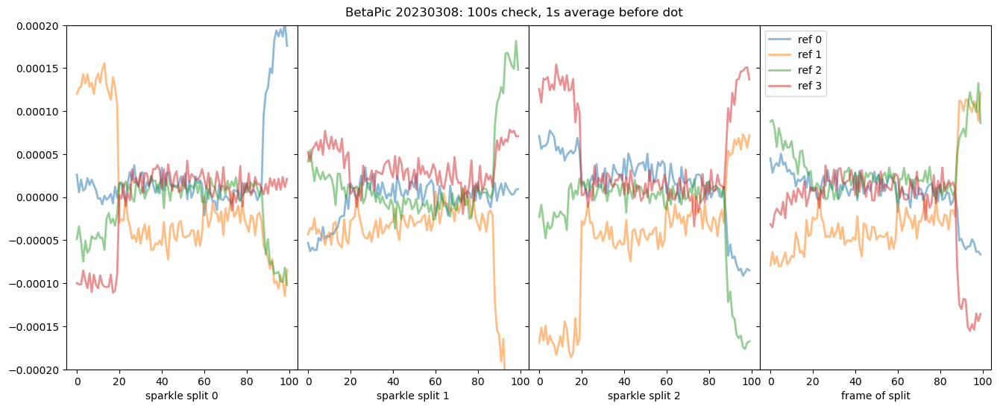

In [184]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16,6), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"BetaPic 20230308: 100s check, 1s average before dot", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(avg_dot[:,e,i], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_xlabel(f"sparkle split {e}")
    axs[e].set_ylim(top=.0002, bottom=-0.0002)

plt.legend()
plt.xlabel('frame of split')
plt.show()

# 

In [185]:
# trying a dotproduct with an average
avg_dot = sp_sky_0308.dot_chunk_pool(450, 1000, n_start=180000, n_workers=100)

processing from file 180000 to 1980000, Chunk size 1800 for 1000 tasks
=> Sampling 1800 files, starting at 180000
=> Sampling 1800 files, starting at 198000=> Sampling 1800 files, starting at 216000

=> Sampling 1800 files, starting at 234000=> Sampling 1800 files, starting at 252000

=> Sampling 1800 files, starting at 270000
=> Sampling 1800 files, starting at 288000
=> Sampling 1800 files, starting at 306000
=> Sampling 1800 files, starting at 324000
=> Sampling 1800 files, starting at 342000
=> Sampling 1800 files, starting at 360000
=> Sampling 1800 files, starting at 378000
=> Sampling 1800 files, starting at 396000
=> Sampling 1800 files, starting at 414000
=> Sampling 1800 files, starting at 432000
=> Sampling 1800 files, starting at 450000
=> Sampling 1800 files, starting at 468000
=> Sampling 1800 files, starting at 486000
=> Sampling 1800 files, starting at 504000
=> Sampling 1800 files, starting at 522000
=> Sampling 1800 files, starting at 540000
=> Sampling 1800 files, st

In [188]:
avg_dot = np.array(avg_dot)
np.save("./saves/dataall_new_1000s.npy", avg_dot)

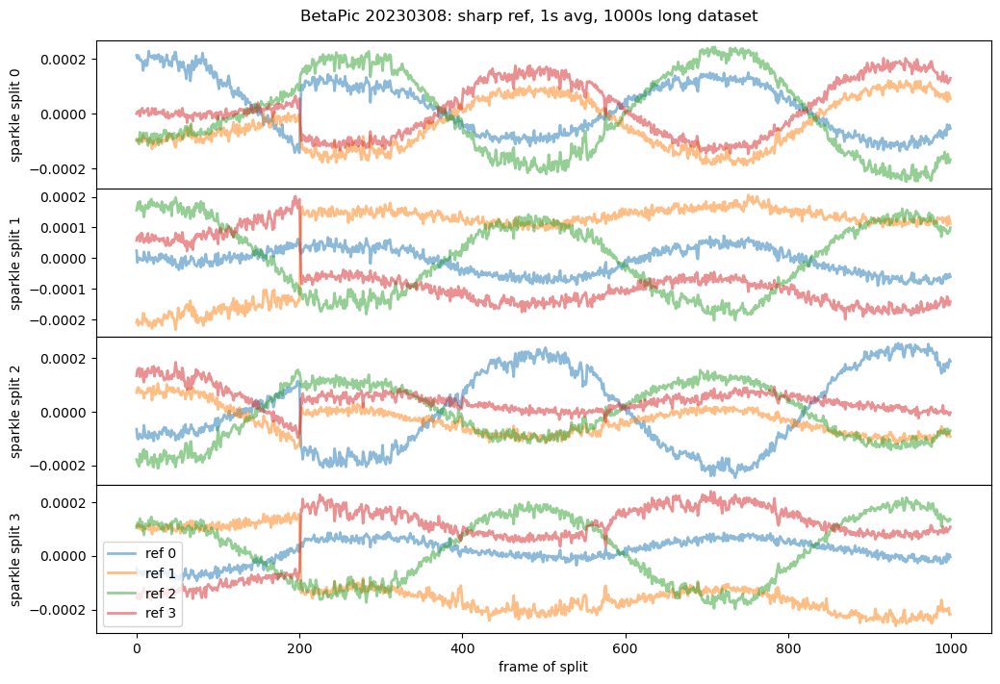

In [189]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: sharp ref, 1s avg, 1000s long dataset", y=0.92)

for e in range(4):
    for i in range(4):
        
        axs[e].plot(avg_dot[:,e,i], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    #axs[e].set_ylim(top=.0002, bottom=-0.0002)

plt.legend()
plt.xlabel('frame of split')
plt.show()

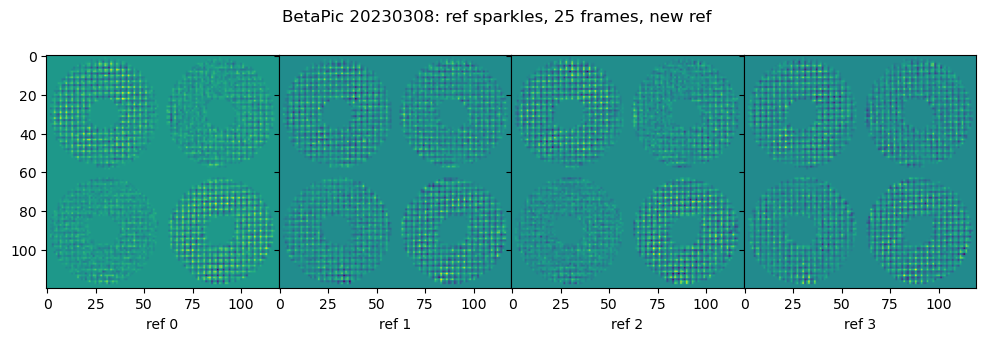

In [143]:
#sp_sky_0308.labref_norm.shape
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"BetaPic 20230308: ref sparkles, 25 frames, new ref", y=0.90)

for e in range(4):
    axs[e].imshow(sp_sky_0308.labref[e], label = f'ref {i}')
    axs[e].set_xlabel(f"ref {e}")

plt.show()

In [145]:
new_dot_list = np.array(sp_sky_0308.dot_list_pool(n=100000, n_workers=60))

chunksize=1667, n_workers=60


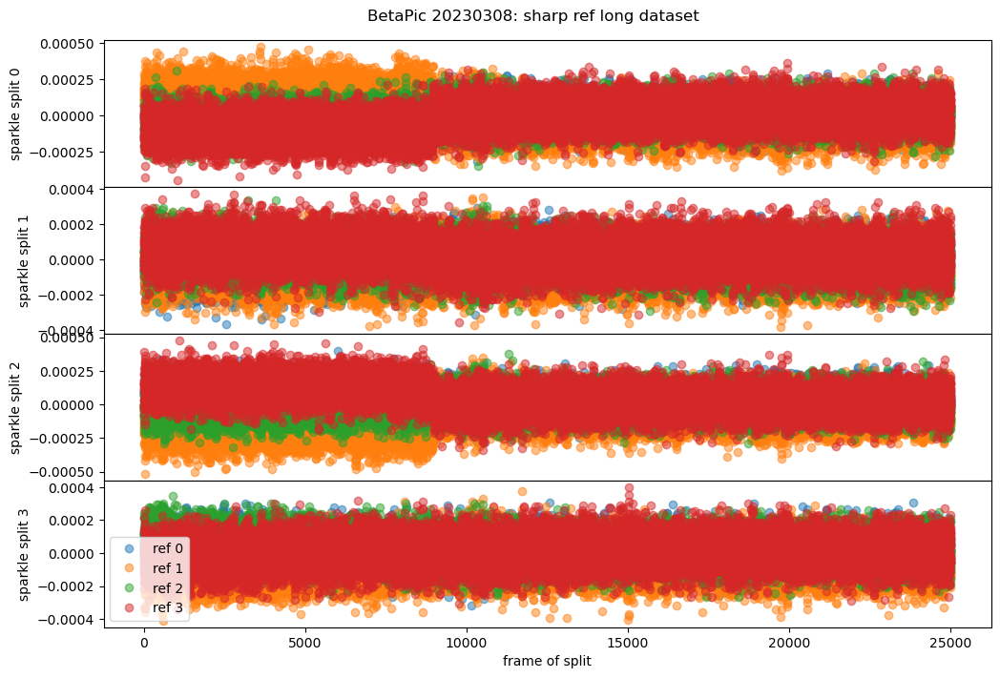

In [150]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: sharp ref long dataset", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(new_dot_list[e::4, i], "o", lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    #axs[e].set_ylim(top=.003, bottom=0.0015)

plt.legend()
plt.xlabel('frame of split')
plt.show()

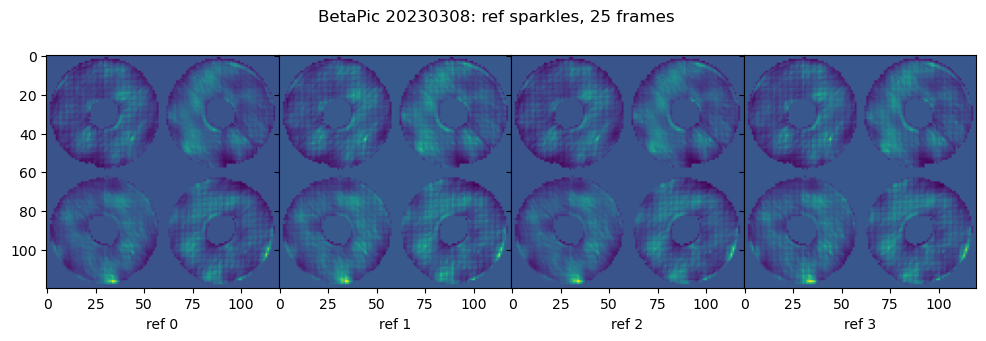

In [45]:
#sp_sky_0308.labref_norm.shape
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"BetaPic 20230308: ref sparkles, 25 frames", y=0.90)

for e in range(4):
    axs[e].imshow(sp_sky_0308.labref_norm[e], label = f'ref {i}')
    axs[e].set_xlabel(f"ref {e}")

plt.show()

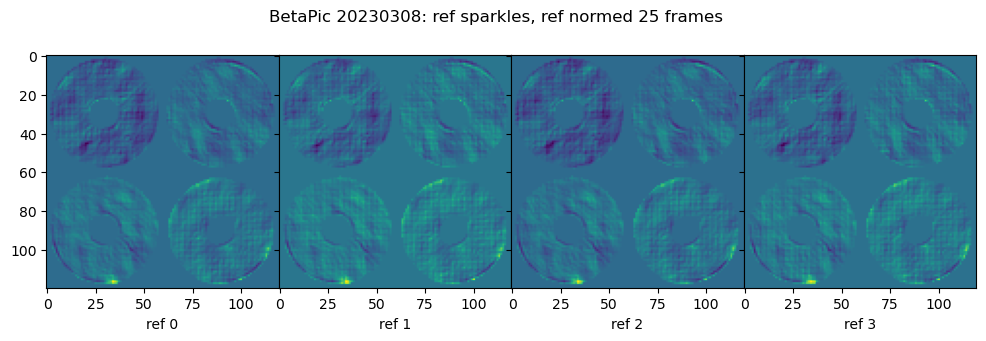

In [46]:
#sp_sky_0308.labref_norm.shape

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"BetaPic 20230308: ref sparkles, ref normed 25 frames", y=0.90)

for e in range(4):
    axs[e].imshow(sp_lab_0308.labref_norm[e], label = f'ref {i}')
    axs[e].set_xlabel(f"ref {e}")

plt.show()

In [151]:
# create a comparison for onsky sparkles
results = sp_sky_0308.file_sample_n_clean(sp_sky_0308.dir_data, 400)
file_sample_0308 = np.array([r[0] for r in results])

=> Sampling 400 files, starting at 0
400


In [ ]:
sp_sky_0308.dot_chunk(sp_sky_0308.data_dir, 100)

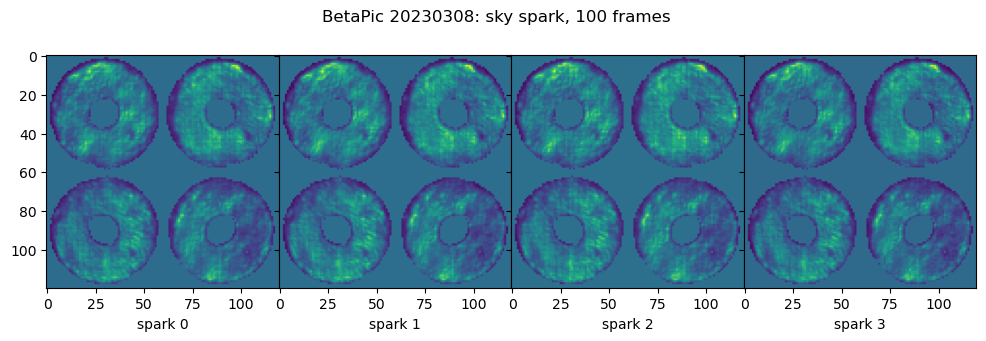

In [39]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"BetaPic 20230308: sky spark, 100 frames", y=0.90)

for e in range(4):
    axs[e].imshow(np.average(file_sample_0308[e::4], axis=0))
    axs[e].set_xlabel(f"spark {e}")

plt.show()

In [40]:
# Saving this to a fits file:
from astropy.io import fits
hdu = fits.ImageHDU()
hdu.data = np.array([np.average(file_sample_0308[e::4], axis=0) for e in range(4)])
hdu.writeto('03_08_bpic_sky.fits')

In [ ]:
results = sp_sky_0308.file_sample_n_clean(sp_sky_0308.dir_data, 400)
file_sample_0308 = np.array([r[0] for r in results])

In [93]:
##### checking the normed dot products
#sp_lab_1Hz_0308 = spkl.Spark(lab_1hz_0313, lab_1hz_0313, dir_calib, dark, mask, ref, ref_norm = True)
results = sp_lab_0308.file_sample_n_clean(sp_lab_0308.dir_data, 100)
file_sample_20seps =  np.array([r[0] for r in results])

=> Sampling 100 files, starting at 0
100


In [99]:
long_term_avg = np.average(file_sample_20seps, axis=0)
file_sample_subtracted = [file - long_term_avg for file in file_sample_20seps]
sample_sub_avgs = [np.average(file_sample_subtracted[e::4], axis=0) for e in range(4)]

In [101]:
dot_products_test = [[np.nansum(sample_sub_avgs[i].flatten()*file.flatten()) for file in file_sample_subtracted] for i in range(4)]

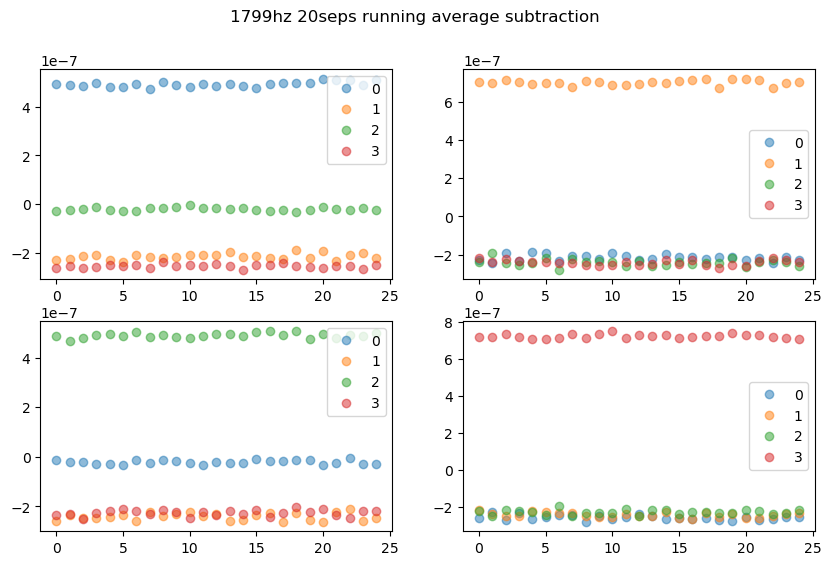

In [105]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10,6), facecolor='white')
plt.suptitle("1799hz 20seps running average subtraction")
for i in range(4):
    for e in range(4):
        axs[i//2][i%2].plot(dot_products_test[i][e::4], 'o',alpha=0.5, label=e)
    axs[i//2][i%2].legend()
    #axs[i//2][i%2].set_ylim(top=3e-6, bottom=-2e-6)

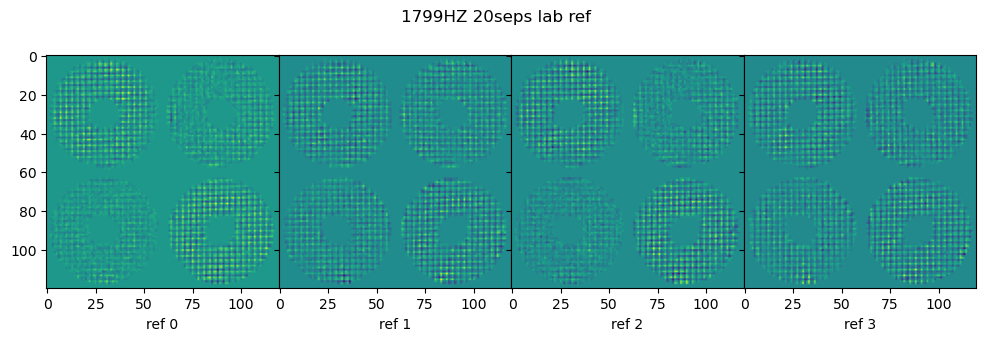

In [104]:
#sp_sky_0308.labref_norm.shape

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"1799HZ 20seps lab ref", y=0.90)

for e in range(4):
    axs[e].imshow(sample_sub_avgs[e], label = f'ref {i}')
    axs[e].set_xlabel(f"ref {e}")

plt.show()

In [106]:
# ok now we do the dot product with these basis, see how we do
# create a comparison for onsky sparkles
results = sp_sky_0308.file_sample_n_clean(sp_sky_0308.dir_data, 100000)
file_sample_0308 = np.array([r[0] for r in results])
dot_products_test = np.array([[np.nansum(sample_sub_avgs[i].flatten()*file.flatten()) for file in file_sample_0308] for i in range(4)])

=> Sampling 400 files, starting at 0
400


In [125]:
sample_sub_avgs_norm = [samp/np.sum(samp) for samp in sample_sub_avgs]
files_norm = [f/np.sum(f) for f in file_sample_0308]

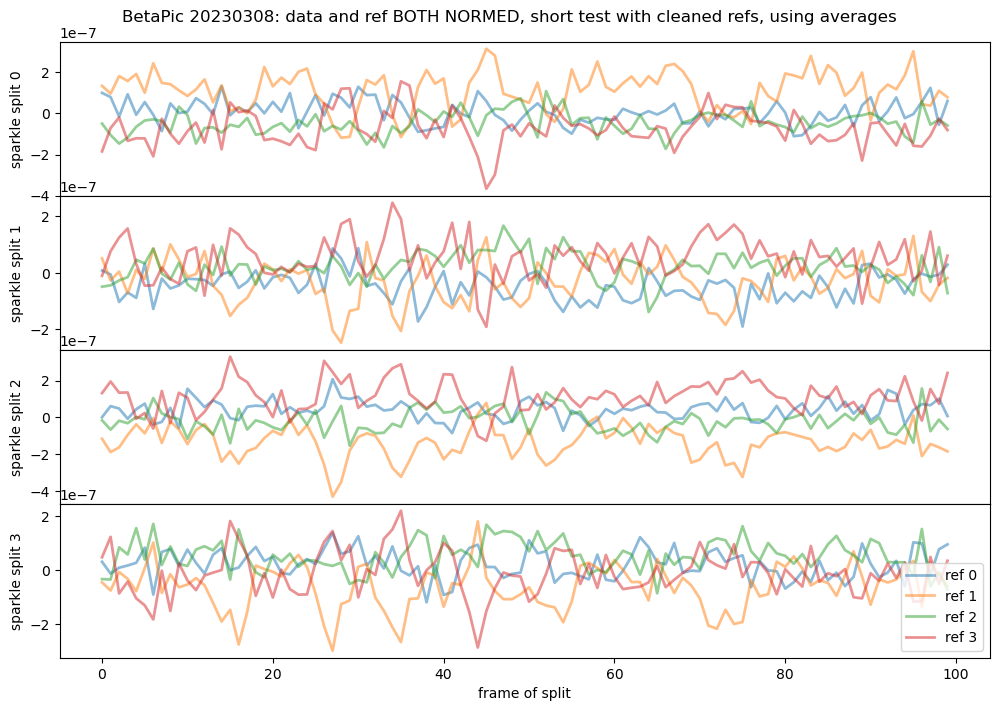

In [139]:
# check the running sparkle dot for each split:
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: data and ref BOTH NORMED, short test with cleaned refs, using averages", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(dot_products_test[i, e::4], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    #axs[e].set_ylim(top=.003, bottom=0.0015)

plt.legend()
plt.xlabel('frame of split')
plt.show()

In [136]:
# try again but now subtract the averages

sky_avg_norm = np.average(file_sample_0308)
file_sample_0308_avgsub = np.array([r - sky_avg_norm for r in file_sample_0308])
dot_products_test_avgsub = np.array([[np.nansum(sample_sub_avgs[i].flatten()*file.flatten()) for file in file_sample_0308_avgsub] for i in range(4)])


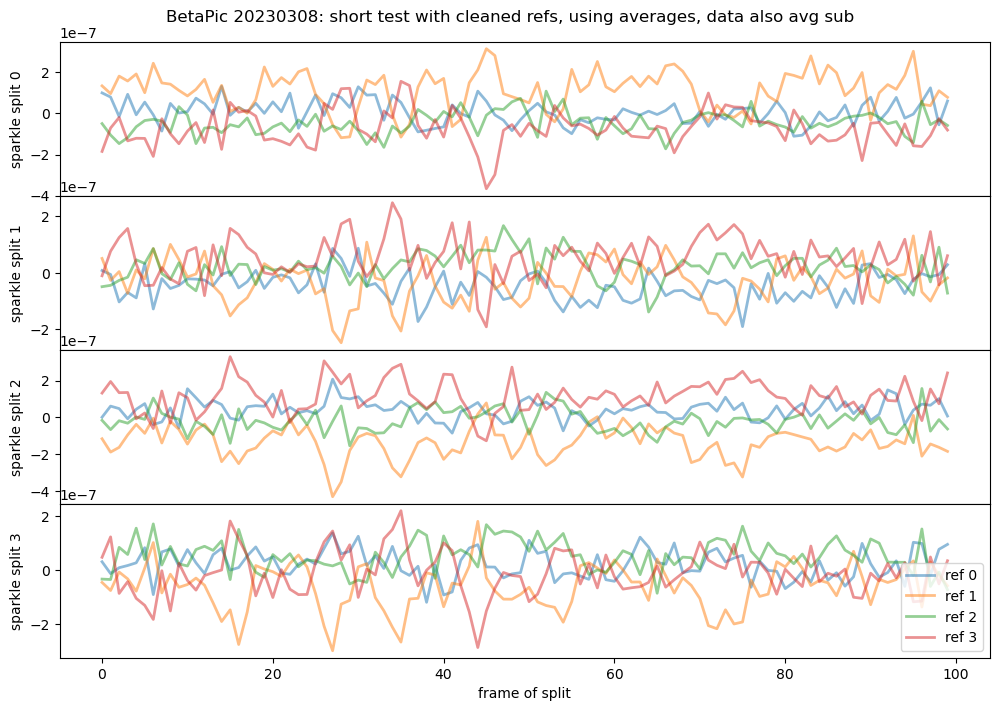

In [137]:
# check the running sparkle dot for each split:
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: short test with cleaned refs, using averages, data also avg sub", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(dot_products_test_avgsub[i, e::4], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    #axs[e].set_ylim(top=.003, bottom=0.0015)

plt.legend()
plt.xlabel('frame of split')
plt.show()

### Short Cut on sky data + flip testing

In [113]:
data_split_s_0308 = np.array(spkl.split_data_roll(np.array(sp_sky_0308.dot_list_pool(n=100000, n_workers=60))))
avg_gain_0308 = np.average([data_split_t/np.average(data_split_l_0308[e]) for e, data_split_t in enumerate(data_split_s_0308)], axis=0)
avg_smoothed_gain_0308, avg_std_gain_0308 = spkl.return_rolling(avg_gain_0308, n=450)


In [115]:
# lab split flipped
sp_lab_0308.set_lab_ref(n_start=30000)
data_split_l_0308_flipped2 = np.array(spkl.split_data_roll(np.array(sp_lab_0308.dot_list_pool(n=100000, n_workers=60))))

=> Sampling 100 files, starting at 30000
100
chunksize=1667, n_workers=60


In [120]:
#change the ref numbs
sp_sky_0308.set_lab_ref(n_start=30000)
data_split_s_0308_flip = np.array(spkl.split_data_roll(np.array(sp_sky_0308.dot_list_pool(n=100000, n_workers=60))))
avg_gain_0308_flip = np.average([data_split_t/np.average(data_split_l_0308[e]) for e, data_split_t in enumerate(data_split_s_0308_flip)], axis=0)
avg_smoothed_gain_0308_flip, avg_std_gain_0308 = spkl.return_rolling(avg_gain_0308_flip, n=450)

=> Sampling 100 files, starting at 30000
100
chunksize=1667, n_workers=60


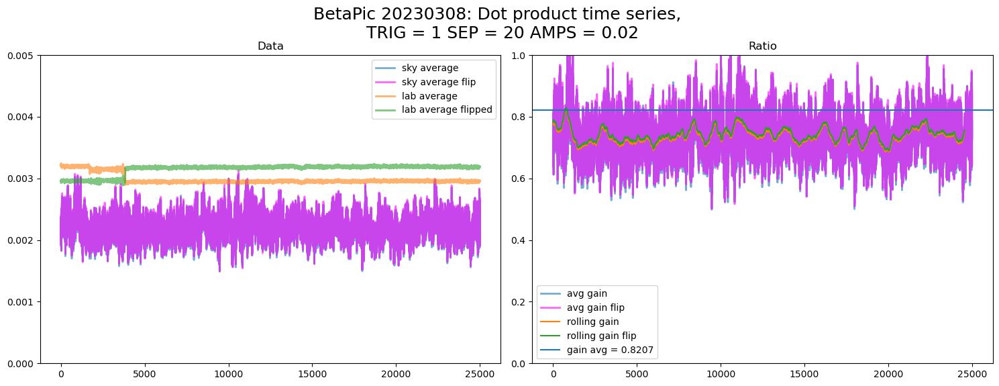

In [121]:
# averages


# Both datasets, same plot
# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), facecolor='white')
plt.subplots_adjust(hspace=0.5)
title_long = f"BetaPic 20230308: Dot product time series, \n TRIG = {sp_sky_0308.data_spark_params['TRIG']} SEP = {sp_sky_0308.data_spark_params['SEPS']} AMPS = {sp_sky_0308.lab_spark_params['AMPS']}"
fig.suptitle(title_long, fontsize=18, y=0.95)

axs_r = axs.ravel()

# plot raw values
axs_r[0].plot(np.average(data_split_s_0308, axis=0), lw=2, alpha = 0.6, label = f'sky average')
axs_r[0].plot(np.average(data_split_s_0308_flip, axis=0), lw=2, alpha = 0.6, label = f'sky average flip', color='magenta')
axs_r[0].plot(np.average(data_split_l_0308, axis=0), lw=2, alpha = 0.6, label = f'lab average')
axs_r[0].plot(np.average(data_split_l_0308_flipped2, axis=0), lw=2, alpha = 0.6, label = f'lab average flipped')
# chart formatting
axs_r[0].set_ylim(top=0.005, bottom=0.00)
axs_r[0].set_title(f"Data")
axs_r[0].legend()

# plot ratios
axs_r[1].plot(avg_gain_0308, lw=2, alpha = 0.6, label = f'avg gain')
axs_r[1].plot(avg_gain_0308_flip, lw=2, alpha = 0.6, label = f'avg gain flip', color='magenta')
axs_r[1].plot(avg_smoothed_gain_0308, label="rolling gain")
axs_r[1].plot(avg_smoothed_gain_0308_flip, label="rolling gain flip", )
axs_r[1].axhline(gain_avg_03_08, label=f"gain avg = {gain_avg_03_08:0.4f}")
# chart formatting
axs_r[1].set_ylim(top=1, bottom=0.00)
axs_r[1].set_title(f"Ratio")
axs_r[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
#THOUGH, these gains are low because I'm using the full lab dataset, I should only be using the same ones I create the reference with.

# create a function that takes the dot product but only with the internal reference, and have a function that computes the gains for me

### Long cut on Sky data

In [11]:
# recalculating data!!!
# instead of this, use spl.main in a screen 

# what makes a mintue of data:
f_list_0308 = sp_sky_0308.file_lister(sp_sky_0308.dir_data)
dir_data = sp_sky_0308.dir_data
data_splits_list = []

for n in range(len(f_list_0308)//(1800*60)):
    ni = n*1800*60
    print(f"==> START: Block {n} starting with file {ni}!")
    try:
        data_split_s_0308 = np.array(spkl.split_data_roll(np.array(sp_sky_0308.dot_list_pool(n_start=ni, n=1800*60, n_workers=60))))
        data_splits_list.append(data_split_s_0308)
    except Exception as e:
        print(f"We had an error at file {ni}!")
        continue
    print(f"  END: Block {n}")

# make sure to save this result!
np.save("./saves/data_splits_list_0308.npy", data_splits_list)


==> START: Block 0 starting with file 0!
chunksize=1800, n_workers=60
  END: Block 0
==> START: Block 1 starting with file 108000!
chunksize=1800, n_workers=60
  END: Block 1
==> START: Block 2 starting with file 216000!
chunksize=1800, n_workers=60
  END: Block 2
==> START: Block 3 starting with file 324000!
chunksize=1800, n_workers=60
  END: Block 3
==> START: Block 4 starting with file 432000!
chunksize=1800, n_workers=60
  END: Block 4
==> START: Block 5 starting with file 540000!
chunksize=1800, n_workers=60
  END: Block 5
==> START: Block 6 starting with file 648000!
chunksize=1800, n_workers=60
  END: Block 6
==> START: Block 7 starting with file 756000!
chunksize=1800, n_workers=60
  END: Block 7
==> START: Block 8 starting with file 864000!
chunksize=1800, n_workers=60
  END: Block 8
==> START: Block 9 starting with file 972000!
chunksize=1800, n_workers=60
  END: Block 9
==> START: Block 10 starting with file 1080000!
chunksize=1800, n_workers=60
  END: Block 10
==> START: B

#### Reloading data

In [29]:
# to reload
data_splits_list = np.load("./saves/data_splits_list_0308.npy")
data_splits_l_stack = np.hstack(data_splits_list)
data_splits_l_stack.shape

(4, 2133000)

In [ ]:
# if you're reloading, you probably also need this:
# lab split
sp_lab_0308 = spkl.Spark(lab_t_dir_0308, lab_t_dir_0308, dir_calib, dark, mask, ref)
data_split_l_0308 = np.array(spkl.split_data_roll(np.array(sp_lab_0308.dot_list_pool(n=1000, n_workers=60))))

### All dotproducts

In [20]:
# new Code
data_splits_all = np.load(sky_t_dir_0308.replace("camwfs/", "data_splits_list.npy"))
data_splits_stack = np.vstack(data_splits_all)

In [10]:
# new Code
lab_splits_all = np.load(sky_t_dir_0308.replace("camwfs/", "lab_splits_list.npy"))
lab_splits_stack = np.vstack(lab_splits_all)

/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


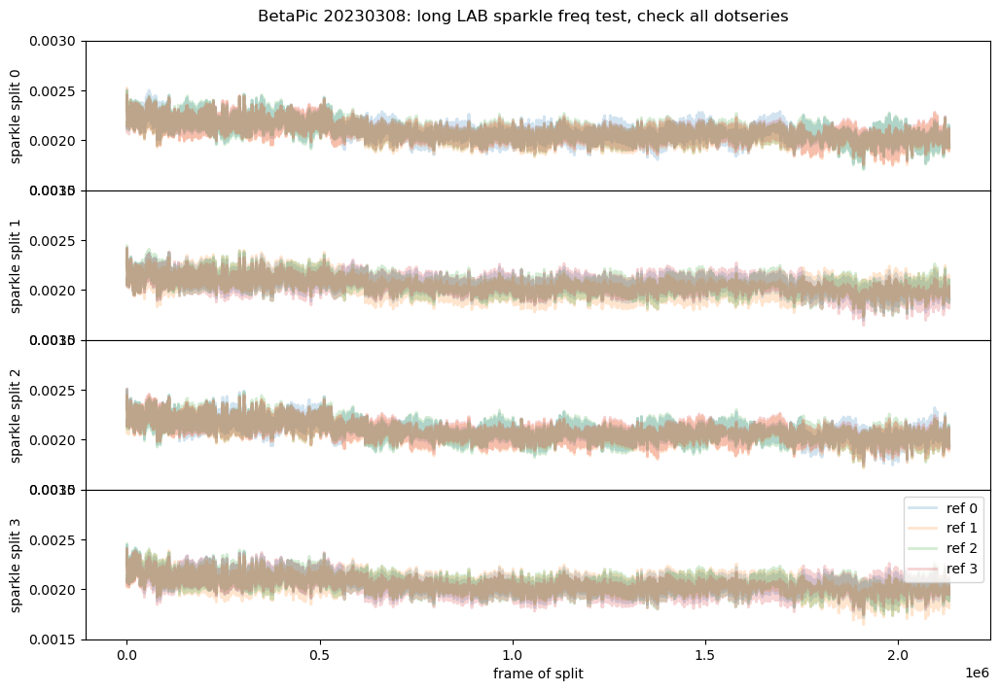

In [13]:
# check the running sparkle dot for each split:
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: long LAB sparkle freq test, check all dotseries", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(spkl.moving_average(data_splits_stack[e::4, i], n=450), lw=2, alpha = 0.2, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    axs[e].set_ylim(top=.003, bottom=0.0015)

plt.legend()
plt.xlabel('frame of split')
plt.show()

### Summary plot

In [10]:
data_splits_stack_03_08 = np.hstack(data_splits_list)

In [13]:
# calculating averages for plotting
avg_lab = np.average(data_split_l_0308[:80], axis=1)
avg_gain_0308_long = np.average([data_split_t/avg_lab[e] for e, data_split_t in enumerate(data_splits_stack_03_08)], axis=0)
avg_smoothed_gain_0308_long, avg_std_gain_0308_long = spkl.return_rolling(avg_gain_0308_long, n=450)

In [73]:
dt_data_03_08 = sp_sky_0308.get_datetime_start(sp_sky_0308.dir_data)
dt_start = np.datetime64(dt_data_03_08)
selfRM_time = np.datetime64(selfRM_data_0308_DT)
print(selfRM_time)

DATETIME start: 2023-03-08T00:55:00.053929000Z
2023-03-08T02:17:29


/tmp/ipykernel_9841/450534094.py:2: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  dt_start = np.datetime64(dt_data_03_08)


In [77]:
diff = selfRM_time - dt_start
offset = diff.item()*10e-9/60/10

In [46]:
x_len = len(avg_gain_0308_long)
x = np.arange(0, x_len/(15*sp_lab_0308.data_HZ), 1/(15*sp_lab_0308.data_HZ))

In [47]:
y_len = len(avg_smoothed_gain_0308_long)
y = np.arange(0, y_len/(15*sp_lab_0308.data_HZ), 1/(15*sp_lab_0308.data_HZ))

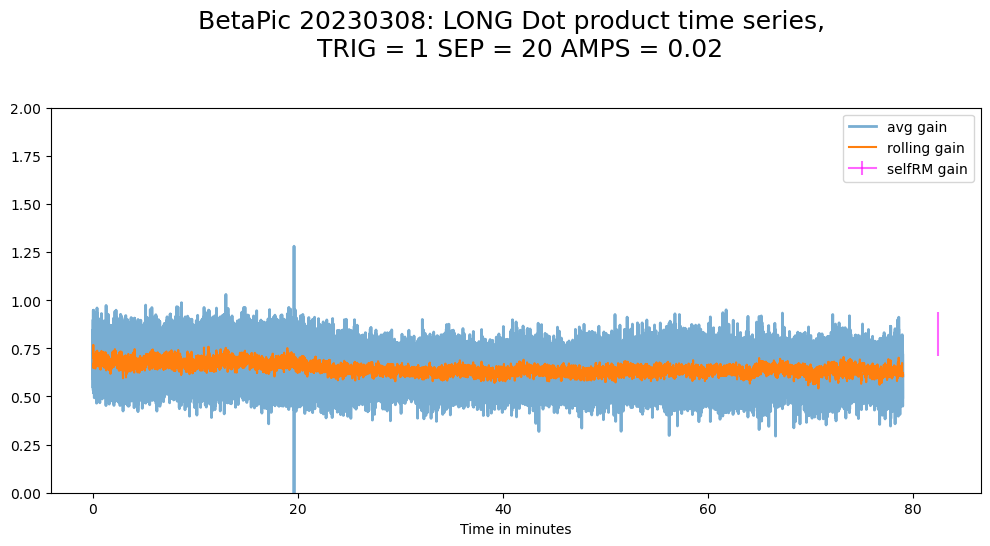

In [81]:
# plot all time
# Both datasets, same plot
# define subplot grid
fig, ax  = plt.subplots(figsize=(12, 5), facecolor='white')
fig.subplots_adjust(hspace=0.5)
sp_data_toref = sp_lab_0308
title_long = f"BetaPic 20230308: LONG Dot product time series, \n TRIG = {sp_data_toref.data_spark_params['TRIG']} SEP = {sp_data_toref.data_spark_params['SEPS']} AMPS = {sp_data_toref.lab_spark_params['AMPS']}"
ax.set_title(title_long, fontsize=18, y=0.99, pad=40)

# plot ratios
ax.plot(x, avg_gain_0308_long, lw=2, alpha = 0.6, label = f'avg gain')
ax.errorbar(offset, np.average(gain_series_0308), yerr = np.std(gain_series_0308), alpha = 0.6, color = 'magenta', label='selfRM gain')
ax.plot(y, avg_smoothed_gain_0308_long, label="rolling gain")
ax.set_xlabel("Time in minutes")
# chart formatting
ax.set_ylim(top=2, bottom=0.00)
ax.legend(loc="upper right")

fig.show()


### Checking average dot products

In [6]:
avg_dot_file = sky_t_dir_0308.replace('camwfs/', "data_chunks_list.npy")
avg_dot_03_08 = np.vstack(np.load(avg_dot_file))
avg_dot_03_08.shape

(4740, 4, 4)

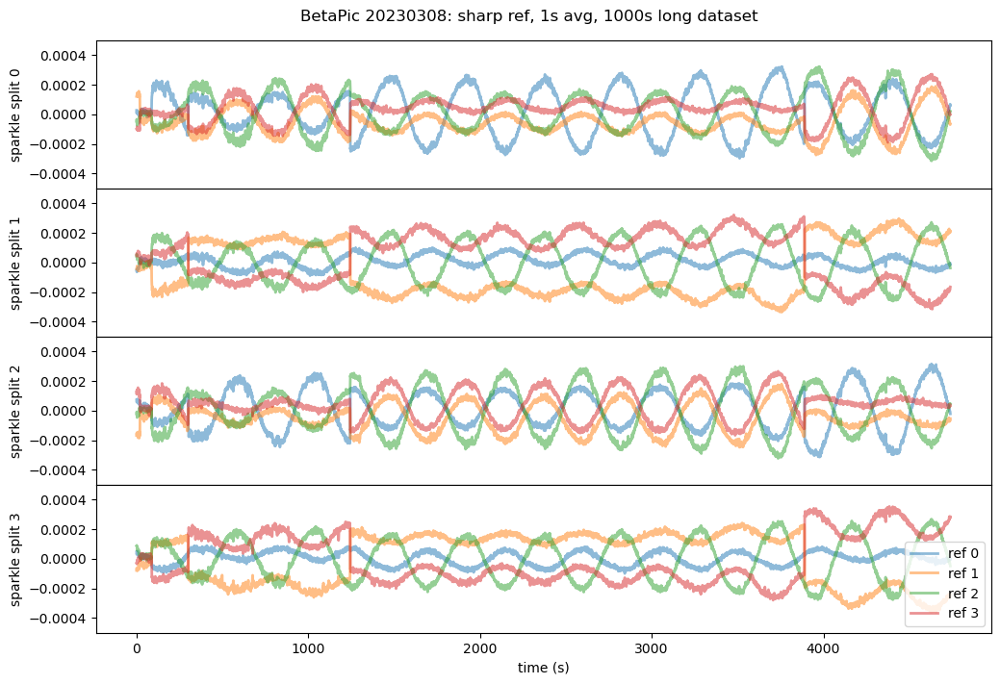

In [7]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: sharp ref, 1s avg, 1000s long dataset", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(avg_dot_03_08[:,e,i], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    axs[e].set_ylim(top=.0005, bottom=-0.0005)

plt.legend()
plt.xlabel('time (s)')
plt.show()

### Testing sinusoidal fits

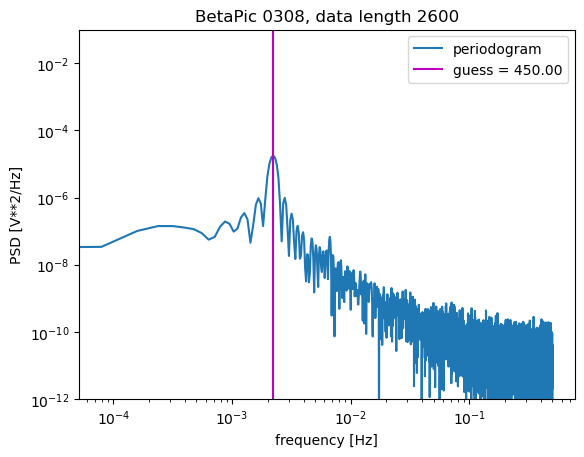

In [8]:
import curve_fits as cf
reload(cf)

x_start = 1250
x_end = 3850

y_data = avg_dot_03_08[x_start:x_end,0,0]
max_f = cf.find_freq(y_data, title=f"BetaPic 0308, data length {x_end-x_start}")

[ 2.60034082e-04 -7.80129869e+00  3.35976212e-06]


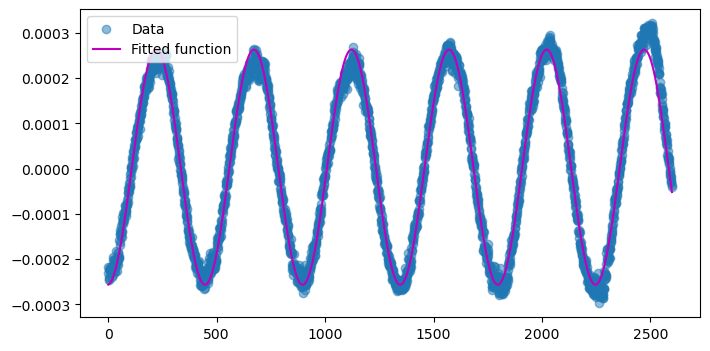

array([ 2.60034082e-04, -7.80129869e+00,  3.35976212e-06])

In [9]:
reload(cf)
# simple one dimension fit
cf.simple_fit(x_start, x_end, avg_dot_03_08[:,0,0])

In [10]:
# trying to fit all the data
reload(cf)
fits_all = cf.window_fits_all(x_start, x_end, avg_dot_03_08, 500)
fits_all.shape

(4, 4, 2100, 3)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


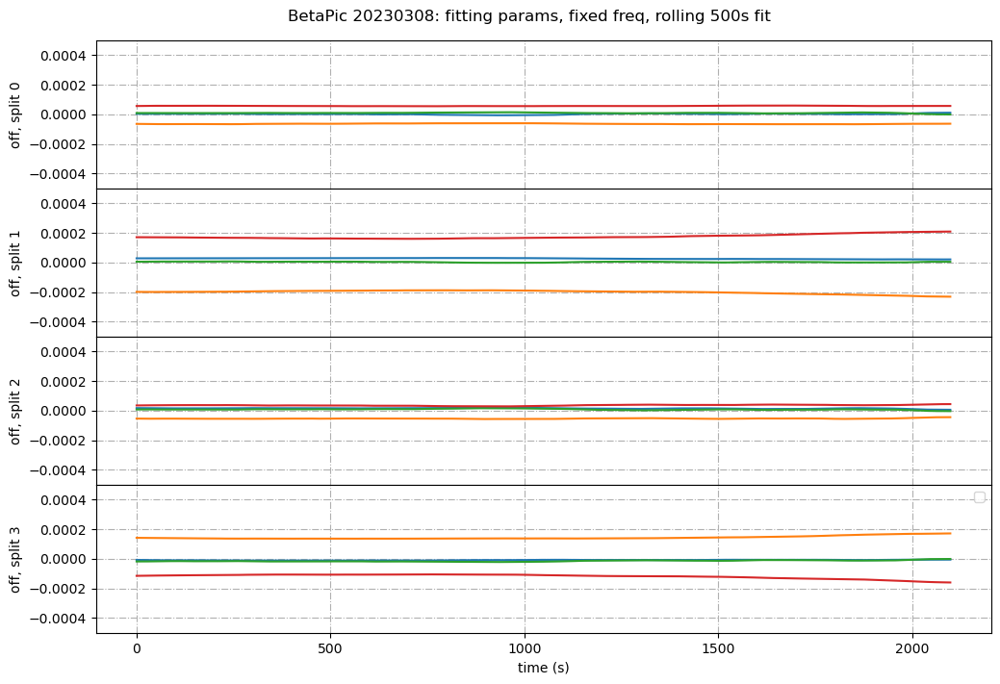

In [80]:
# todo: make the gains plots
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle("BetaPic 20230308: fitting params, fixed freq, rolling 500s fit", y=0.92)

param_names = ["amp", "phase", "off"]

for e in range(4):
    axs[e].plot(fits_all[e,:,:,2].T)
    axs[e].set_ylabel( f"{param_names[2]}, split {e}")
    axs[e].set_ylim(top=.0005, bottom=-0.0005)
    axs[e].grid(linestyle='-.')

plt.legend()
plt.xlabel('time (s)')
plt.show()

In [11]:
# loading the relevant lab data
lab_dotseries_f = lab_t_dir_0308.replace("camwfs/", "lab_splits_total_list.npy")
dot_series = np.load(lab_dotseries_f)
lab_averages = [np.mean(dot_series[e::4,e]) for e in range(4)]

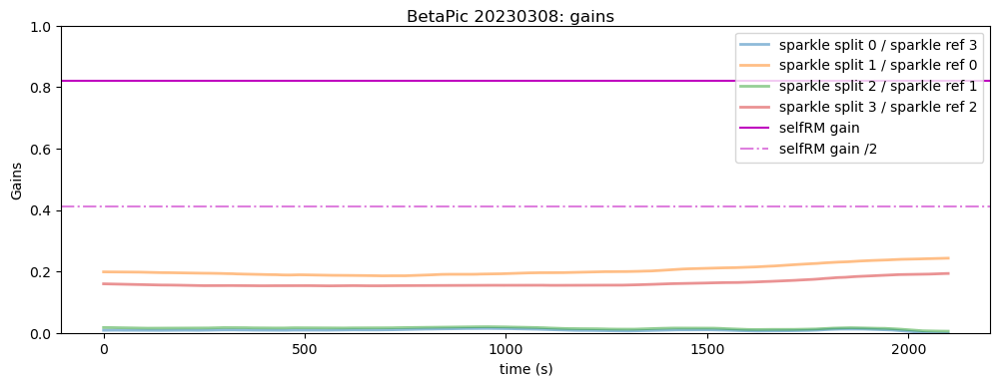

In [24]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,4), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"BetaPic 20230308: gains", y=0.92)

for i in range(4):
    axs.plot(fits_all[i,(i+2)%4,:,2].T / lab_averages[i], lw=2, alpha = 0.5, label = f"sparkle split {i} / sparkle ref {(i+3)%4}")


axs.set_ylim(top=1, bottom=0.000)

axs.set_ylabel("Gains")

plt.axhline(np.average(gain_series_0308), linestyle='-',c="m", label='selfRM gain')
plt.axhline(np.average(gain_series_0308)/2, linestyle='-.', c="m", label='selfRM gain /2', alpha = 0.5)

plt.legend()
plt.xlabel('time (s)')
plt.show()

# March 11th - HD72946

Number of REF files:  9918235

MOD : 1   TRIG : 1   FREQ : 2000   SEPS : 15   ANGS : 0   AMPS : 0.05   CROSS : 1 

In [1]:
data_dir = '/home/eden/data/2023A/'
data_s_0311 = data_dir + '03_11_spark_HD72946/camwfs/'

In [5]:
sp_sky_0311 = spkl.Spark(data_s_0311, data_s_0311, dir_calib, dark, mask, ref) #skipping bc FREQ

HZ value: 1800
HZ value: 1800
Number of DATA files:  9918235
Number of REF files:  9918235
MOD : 1   TRIG : 1   FREQ : 2000   SEPS : 15   ANGS : 0   AMPS : 0.05   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 2000   SEPS : 15   ANGS : 0   AMPS : 0.05   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0
100


# March 10th - HR4796A

03_10_spark_HR4796A

In [ ]:
# selfRMs

## 03_10 WFS data

In [20]:
data_dir = '/home/eden/data/2023A/'
data_s_0310 = data_dir + '03_10_spark_HR4796A/camwfs/'
data_l_0310 = data_dir + "/LAB/lab_1800_sparkles_1Hz_amp020_sep15/camwfs/"

In [19]:
reload(spkl)
sp_sky_0310 = spkl.Spark(data_s_0310, data_l_0310, dir_calib, dark, mask, ref)
#sp_l_0310 = spkl.Spark(data_l_0313, data_l_0313, dir_calib, dark, mask, ref)

HZ value: 1800
HZ value: 1800
Number of DATA files:  10524575
Number of REF files:  331816
MOD : 1   TRIG : 1   FREQ : 1   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 4   ANGS : 0   AMPS : 0.02   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0


In [22]:
list_files = sp_sky_0310.file_lister(sp_sky_0310.dir_data)

In [25]:
list_files[0]

'camwfs_20230310054736870474000.fits'

In [28]:
file_tiles = [int(file[7:-5]) for file in list_files]

TypeError: unsupported operand type(s) for -: 'list' and 'list'

In [29]:
file_diffs = np.array(file_tiles[1:]) - np.array(file_tiles[:-1])

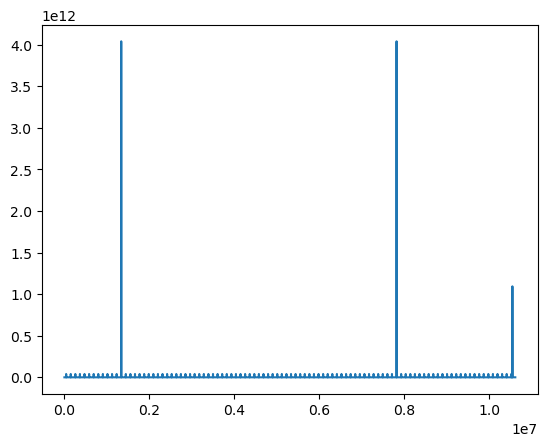

In [30]:
plt.plot(file_diffs)

# March 12th 03_12_TWA7

In [10]:
data_s_0312_TWA = data_dir + '03_12_spark_TWA7_C/camwfs/'
#data_l_0313_HD = data_dir + "03_08_sparkles_selfRM_1800/camwfs/"

In [11]:
sp_sky_0312A = spkl.Spark(data_s_0312_TWA, data_s_0312_TWA, dir_calib, dark, mask, ref) #skipping bc FREQ

HZ value: 1200
HZ value: 1200
Number of DATA files:  4501267
Number of REF files:  4501267
MOD : 1   TRIG : 1   FREQ : 899.911   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 899.911   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0


# March 13th 03_13_spark_HD106906

In [12]:
data_dir = '/home/eden/data/2023A/'
data_s_0313_HD106906 = data_dir + '03_13_spark_HD106906/camwfs/'
#data_l_0313_HD106906 = data_dir + "03_08_sparkles_selfRM_1800/camwfs/"

In [13]:
sp_sky_0313_HD106906 = spkl.Spark(data_s_0313_HD106906, data_s_0313_HD106906, dir_calib, dark, mask, ref) #skipping bc FREQ

HZ value: 1800
HZ value: 1800
Number of DATA files:  8965526
Number of REF files:  8965526
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0


In [ ]:
# show single split

In [ ]:
# show averaged split

## 03_13 WFS HD106906

# March 13th HR2562

MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1 

In [41]:
data_dir = '/home/eden/data/2023A/'
data_s_0313 = data_dir + '03_13_spark_HR2562/camwfs/'
data_l_0313 = data_dir + "LAB/lab_1800_sparkles_1Hz_amp020_sep15/camwfs/"

In [16]:
sp_sky_0313 = spkl.Spark(data_s_0313, data_l_0313, dir_calib, dark, mask, ref)
sp_l_0313 = spkl.Spark(data_l_0313, data_l_0313, dir_calib, dark, mask, ref)

=> Sampling 100 files, starting at 0
100
HZ value: 1800
HZ value: 1800
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 15   ANGS : 0   AMPS : 0.02   CROSS : 1  
=> Sampling 100 files, starting at 0
100
HZ value: 1800
HZ value: 1800
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1799.82   SEPS : 20   ANGS : 0   AMPS : 0.02   CROSS : 1  


## 03_13 SelfRM

In [48]:
RM_dir = "/home/eden/data/self_RMs/"
data_0312_05gain = fits.open(RM_dir + 'selfRM_20230312_13_HR2562_sep15_amp_02_05gains.fits')[0].data
data_0312_10gain  = fits.open(RM_dir + 'selfRM_20230312_13_HR2562_sep15_amp_02.fits')[0].data
data_0312_labEq = fits.open(RM_dir + 'selfRM_20230311_12_LAB_spark_1800_020amps_20seps.fits')[0].data

In [49]:
gain05_series_0313 = np.diag(data_0312_05gain[5])/np.diag(data_0312_labEq[5])
gain10_series_0313 = np.diag(data_0312_10gain[5])/np.diag(data_0312_labEq[5])

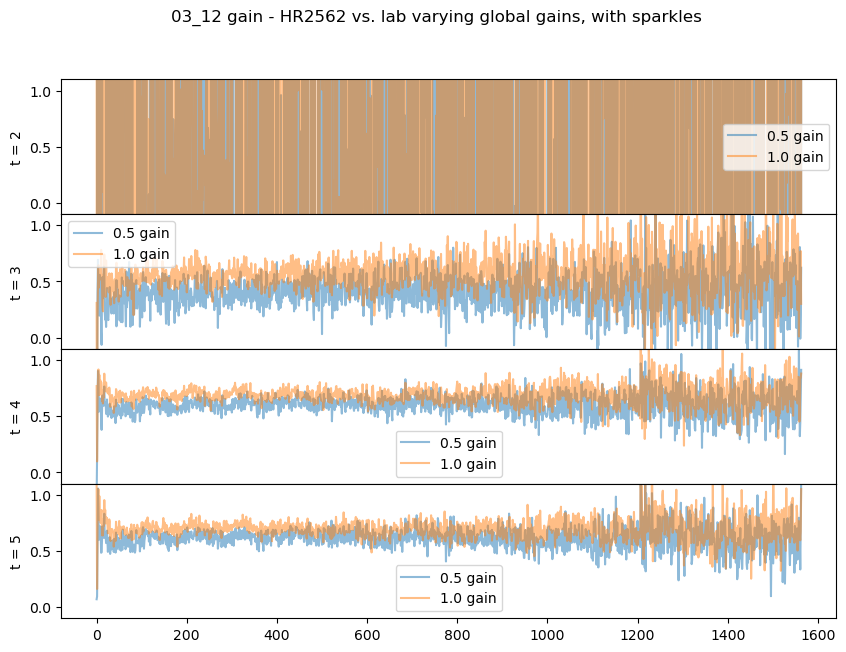

In [6]:
# div by lab gains
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 7), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle("03_12 gain - HR2562 vs. lab varying global gains, with sparkles")

offset = 2

for i in range(4):
    axs[i].set_ylabel(f"t = {i+offset}")
    axs[i].plot(np.diag(data_0312_05gain[i+offset])/np.diag(data_0312_labEq[i+offset]), label="0.5 gain", alpha=0.5)
    axs[i].plot(np.diag(data_0312_10gain[i+offset])/np.diag(data_0312_labEq[i+offset]), label="1.0 gain", alpha=0.5)
    axs[i].legend()
    axs[i].set_ylim(top=1.1, bottom=-0.1)
plt.show()

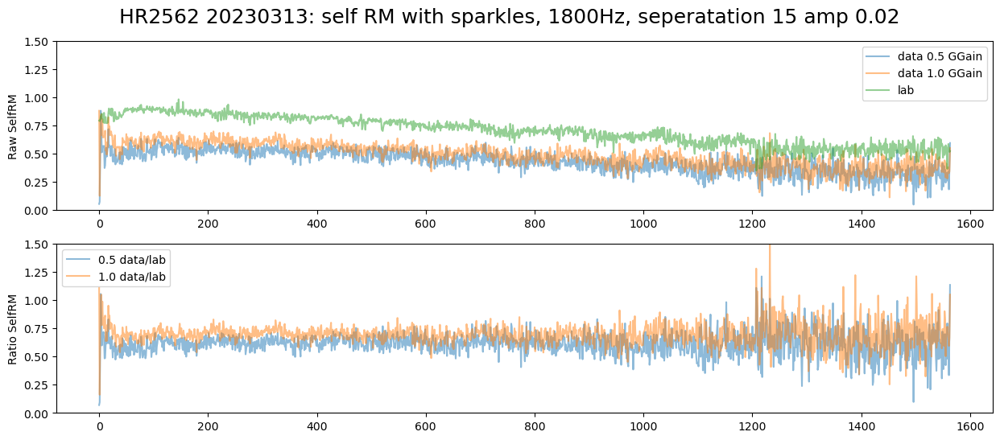

In [7]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 6), facecolor='white')
fig.suptitle("HR2562 20230313: self RM with sparkles, 1800Hz, seperatation 15 amp 0.02", fontsize=18, y=0.95)

axs[0].set_ylabel("Raw SelfRM")
axs[0].plot(np.diag(data_0312_05gain[5]), label="data 0.5 GGain", alpha=0.5)
axs[0].plot(np.diag(data_0312_10gain[5]), label="data 1.0 GGain", alpha=0.5)
axs[0].plot(np.diag(data_0312_labEq[5]), label="lab", alpha=0.5)
axs[0].set_ylim(top=1.5, bottom=0)
axs[0].legend()

axs[1].set_ylabel("Ratio SelfRM")
axs[1].plot(np.diag(data_0312_05gain[5])/np.diag(data_0312_labEq[5]), label="0.5 data/lab", alpha=0.5) 
axs[1].plot(np.diag(data_0312_10gain[5])/np.diag(data_0312_labEq[5]), label="1.0 data/lab", alpha=0.5) 
axs[1].set_ylim(top=1.5, bottom=0)
axs[1].legend()
plt.show()


## 03_13 WFS - data quick

In [12]:
sp_sky_0313.ref_avg # I don;t think this workesd

array([1.0285345e-05, 1.0392537e-05, 1.0268644e-05, 1.0460585e-05],
      dtype=float32)

In [17]:
data_split_sky_0313 = np.array(spkl.split_data_roll(np.array(sp_sky_0313.dot_list_pool(n=100000, n_workers=60))))
data_split_lab_0313 = np.array(spkl.split_data_roll(np.array(sp_l_0313.dot_list_pool(n=100000, n_workers=60))))

chunksize=1667, n_workers=60


In [19]:
avg_gain_0313 = np.average([data_split_t/np.average(data_split_lab_0313[e]) for e, data_split_t in enumerate(data_split_sky_0313)], axis=0)
avg_smoothed_gain_0313, avg_std_gain_0313 = spkl.return_rolling(avg_gain_0313, n=450)


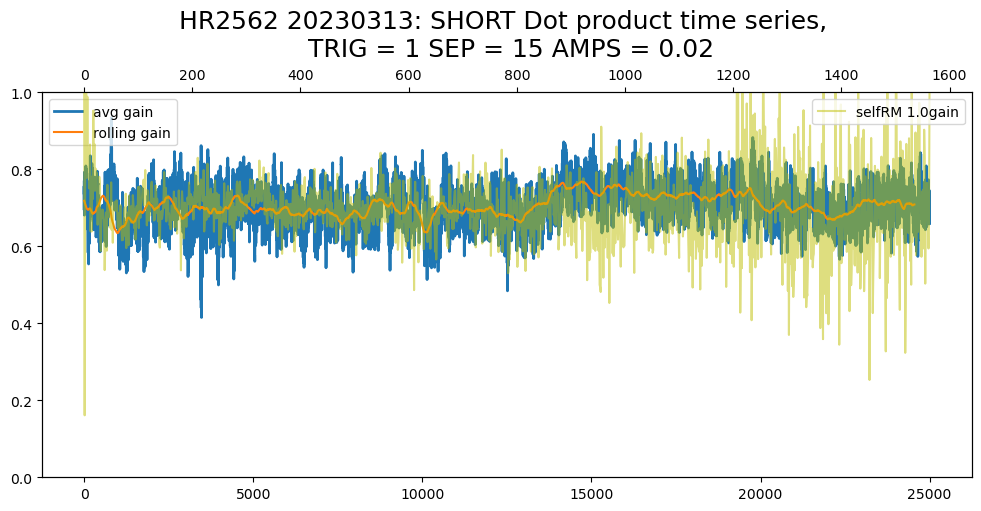

In [32]:
# plot all time
# Both datasets, same plot
# define subplot grid
fig, ax  = plt.subplots(figsize=(12, 5), facecolor='white')
fig.subplots_adjust(hspace=0.5)
title_long = f"HR2562 20230313: SHORT Dot product time series, \n TRIG = {sp_sky_0313.data_spark_params['TRIG']} SEP = {sp_sky_0313.data_spark_params['SEPS']} AMPS = {sp_sky_0313.lab_spark_params['AMPS']}"
ax.set_title(title_long, fontsize=18, y=0.95, pad=40)

# plot ratios
ax.plot(avg_gain_0313, lw=2, alpha = 1.0, label = f'avg gain')
ax2 = ax.twiny()
#ax2.plot(gain05_series_0313, alpha = 0.5, color = 'magenta', label='selfRM 0.5gain')
ax2.plot(gain10_series_0313, alpha = 0.5, color = 'y', label='selfRM 1.0gain')
ax.plot(avg_smoothed_gain_0313, label="rolling gain")

# chart formatting
ax.set_ylim(top=1, bottom=0.00)
ax.legend(loc='upper left')
ax2.legend(loc='upper right')

fig.show()

## WFS long data

In [28]:
# this reduction was done on a seperate screen with main_chunk(data_dir, lab_dir)
data_03_13_HR2562 = np.load('/home/eden/data/2023A/03_13_spark_HR2562/data_chunks_list.npy')

In [31]:
avg_dot_03_13 = np.vstack(data_03_13_HR2562)
avg_dot_03_13.shape

(4260, 4, 4)

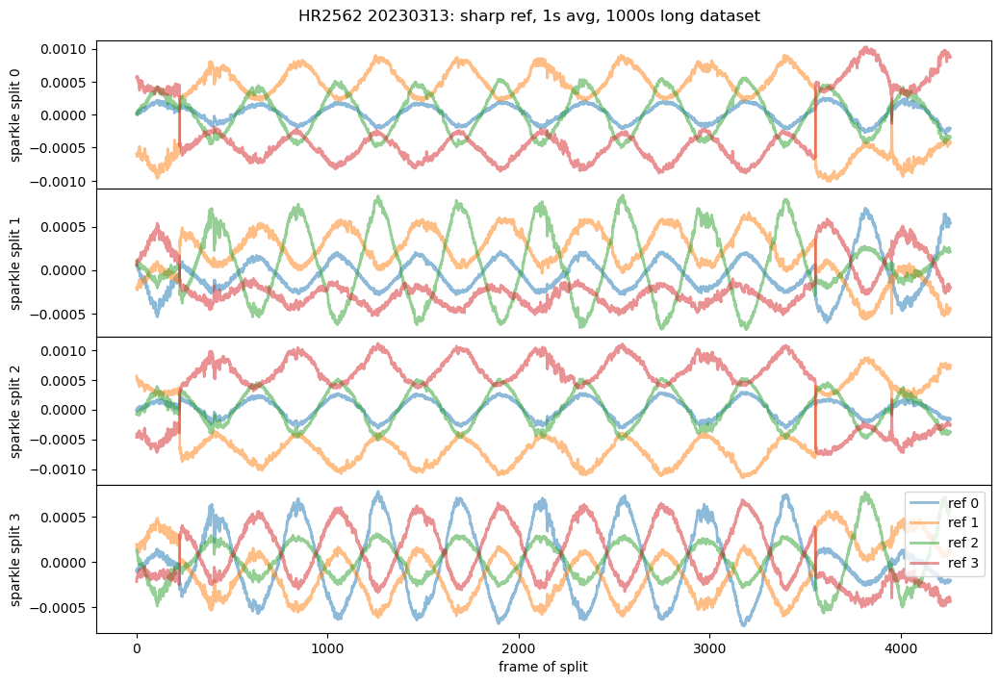

In [32]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"HR2562 20230313: sharp ref, 1s avg, 1000s long dataset", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(avg_dot_03_13[:,e,i], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    #axs[e].set_ylim(top=.0002, bottom=-0.0002)

plt.legend()
plt.xlabel('frame of split')
plt.show()

### testing sinusoidal fits

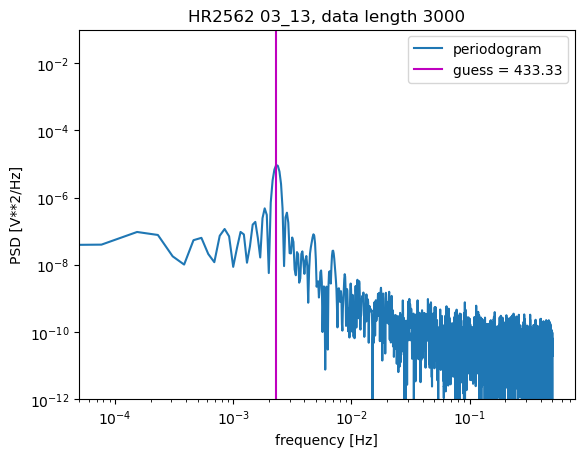

In [33]:
import curve_fits as cf
reload(cf)

# CHECK: oscillation frequency
x_start = 300
x_end = 3300

y_data = avg_dot_03_13[x_start:x_end,0,0]
max_f = cf.find_freq(y_data, title=f"HR2562 03_13, data length {x_end-x_start}")

[-1.61737232e-04  1.03352666e-01  1.64376304e-05]


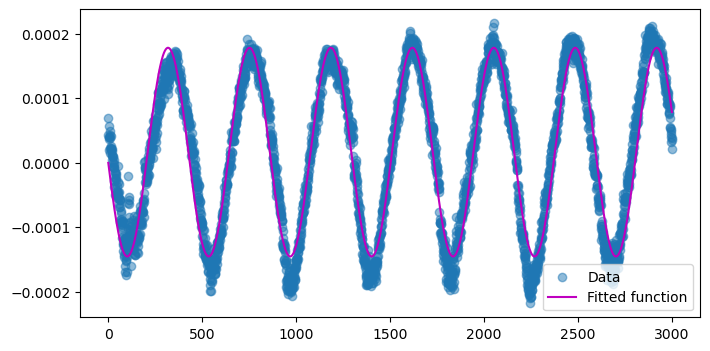

array([-1.61737232e-04,  1.03352666e-01,  1.64376304e-05])

In [35]:
# CHECK: simple one dimension fit
cf.simple_fit(x_start, x_end, avg_dot_03_13[:,0,0])

In [37]:
# FIT: fitting all the data with a window
fits_all = cf.window_fits_all(x_start, x_end, avg_dot_03_13, 500)
fits_all.shape

(4, 4, 2500, 3)

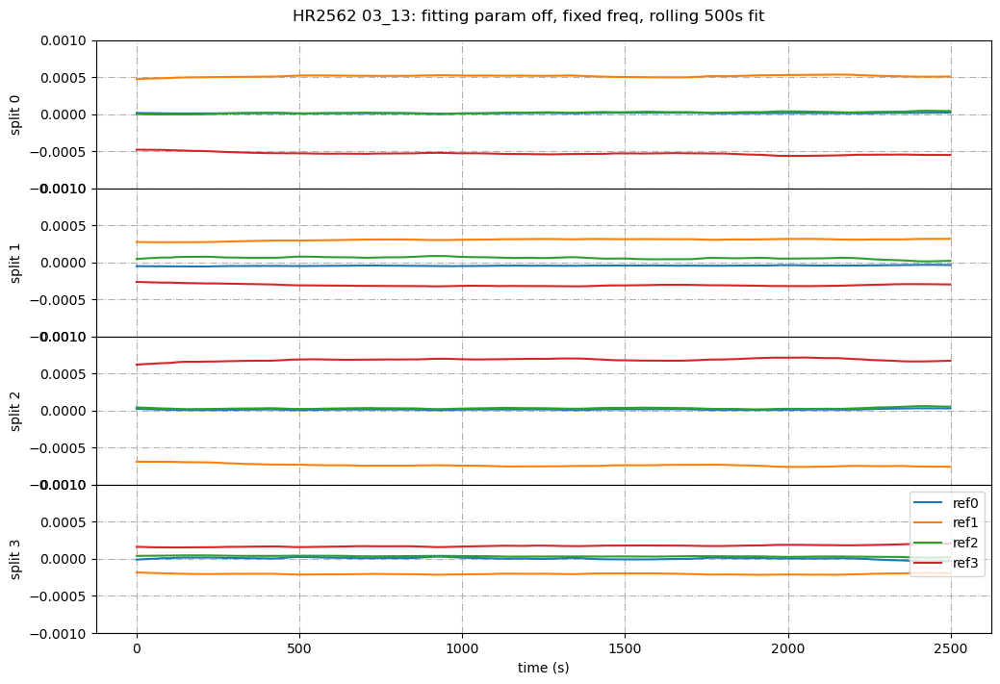

In [45]:
# PLOT: offset value on these fits
n_param = 2


fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"HR2562 03_13: fitting param {param_names[n_param]}, fixed freq, rolling 500s fit", y=0.92)

param_names = ["amp", "phase", "off"]

for e in range(4):
    axs[e].plot(fits_all[e,:,:,n_param].T, label=[f'ref{i}' for i in range(4)])
    axs[e].set_ylabel(f"split {e}")
    axs[e].set_ylim(top=.001, bottom=-0.001)
    axs[e].grid(linestyle='-.')

axs[e].legend()
plt.xlabel('time (s)')
plt.show()

In [46]:
# LOAD: Lab data
lab_dotseries_f = data_l_0313.replace("camwfs/", "lab_splits_total_list.npy")
dot_series = np.load(lab_dotseries_f)
lab_averages = [np.mean(dot_series[e::4,e]) for e in range(4)]


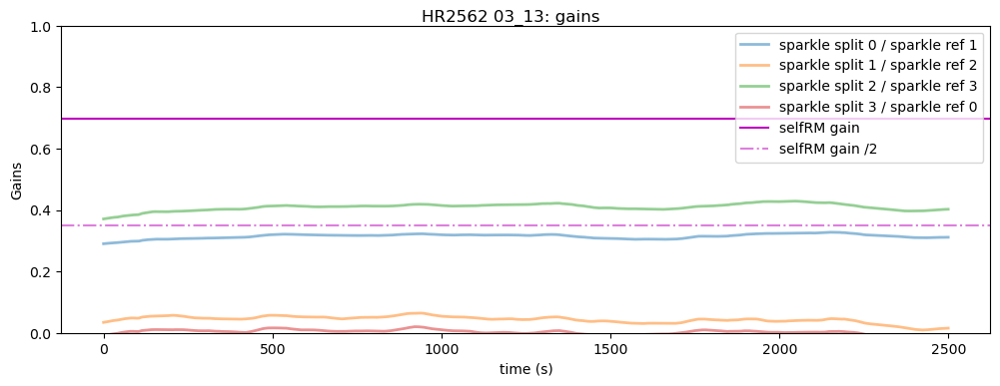

In [56]:
# PLOT: gains
# warning: need to calculate the selfRM gains for this to work. 
self_rm_gain = gain10_series_0313
ref_off = 1 # ref sparkles offset

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,4), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"HR2562 03_13: gains", y=0.92)

for i in range(4):
    axs.plot(fits_all[i,(i+ref_off)%4,:,2].T / lab_averages[(i+ref_off)%4], lw=2, alpha = 0.5, label = f"sparkle split {i} / sparkle ref {(i+ref_off)%4}")

axs.set_ylim(top=1, bottom=0.000)
axs.set_ylabel("Gains")
plt.axhline(np.average(self_rm_gain), linestyle='-',c="m", label='selfRM gain')
plt.axhline(np.average(self_rm_gain)/2, linestyle='-.', c="m", label='selfRM gain /2', alpha = 0.5)

plt.legend()
plt.xlabel('time (s)')
plt.show()

# March 14th - HD100546

In [13]:
data_dir = '/home/eden/data/2023A/'
data_s_0314 = data_dir + '03_14_spark_HD100546/camwfs/'
data_l_0314 = data_dir + "LAB/lab_1800_sparkles_1Hz_amp016_sep15/camwfs/"

In [14]:
sp_sky_0314 = spkl.Spark(data_s_0314, data_l_0314, dir_calib, dark, mask, ref) #skipping bc FREQ

HZ value: 1800
HZ value: 1800
Number of DATA files:  14404739
Number of REF files:  18000
MOD : 1   TRIG : 1   FREQ : 1   SEPS : 15   ANGS : 0   AMPS : 0.016   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1   SEPS : 15   ANGS : 0   AMPS : 0.016283   CROSS : 1  
GENERATING REFERENCE
=> Sampling 100 files, starting at 0


In [57]:
# this reduction was done on a seperate screen with main_chunk(data_dir, lab_dir)
data_03_14_HD100546 = np.load('/home/eden/data/2023A/03_14_spark_HD100546/data_chunks_list.npy')
avg_dot_03_14 = np.vstack(data_03_14_HD100546)
avg_dot_03_14.shape

(7980, 4, 4)

(7980, 4, 4)

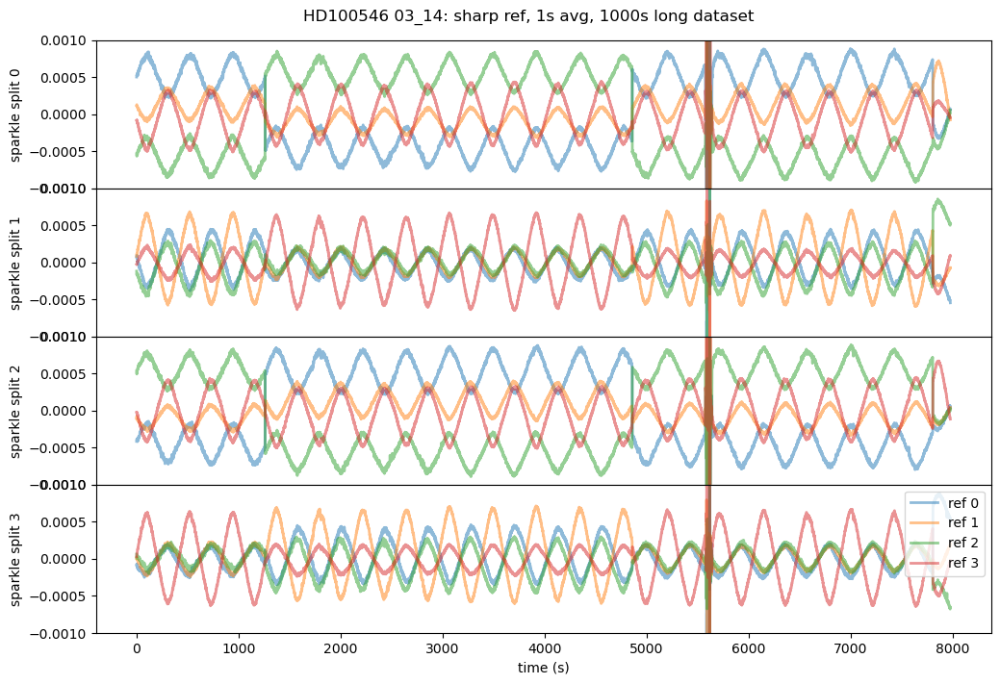

In [20]:
# Redid the ref code, now checking the series
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"HD100546 03_14: sharp ref, 1s avg, 1000s long dataset", y=0.92)

for e in range(4):
    for i in range(4):
        axs[e].plot(avg_dot_03_14[:,e,i], lw=2, alpha = 0.5, label = f'ref {i}')
    axs[e].set_ylabel(f"sparkle split {e}")
    axs[e].set_ylim(top=.001, bottom=-0.001)

plt.legend()
plt.xlabel('time (s)')
plt.show()

### testing sinusoidal fits

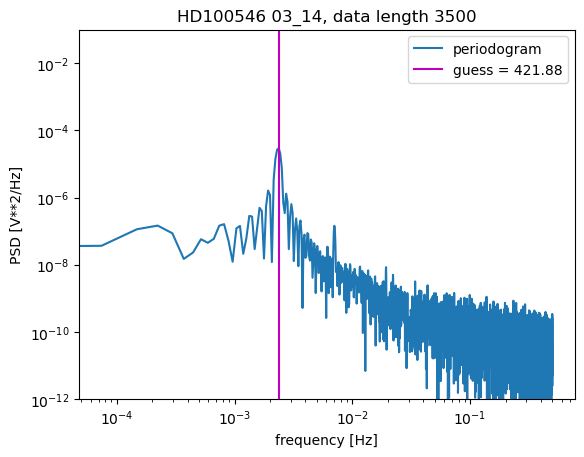

In [68]:
import curve_fits as cf
reload(cf)

# CHECK: oscillation frequency
x_start = 1300
x_end = 4800

y_data = avg_dot_03_14[x_start:x_end,0,0]
max_f = cf.find_freq(y_data, title=f"HD100546 03_14, data length {x_end-x_start}")

[ 2.50666778e-04  3.38928520e-01 -4.54432418e-04]


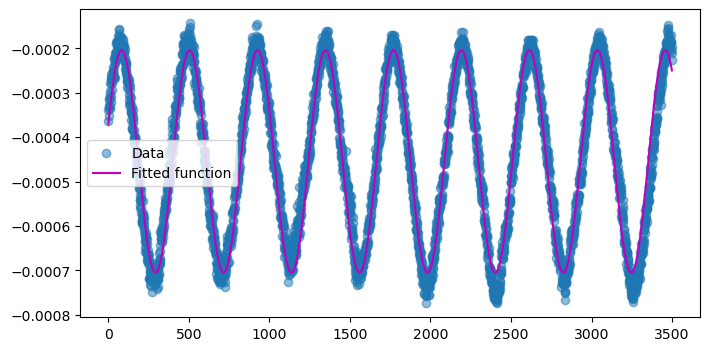

array([ 2.50666778e-04,  3.38928520e-01, -4.54432418e-04])

In [69]:
# CHECK: simple one dimension fit
cf.simple_fit(x_start, x_end, avg_dot_03_14[:,0,0])

In [72]:
# FIT: fitting all the data with a window
fits_all = cf.window_fits_all(x_start, x_end, avg_dot_03_14, 500)
fits_all.shape

(4, 4, 3000, 3)

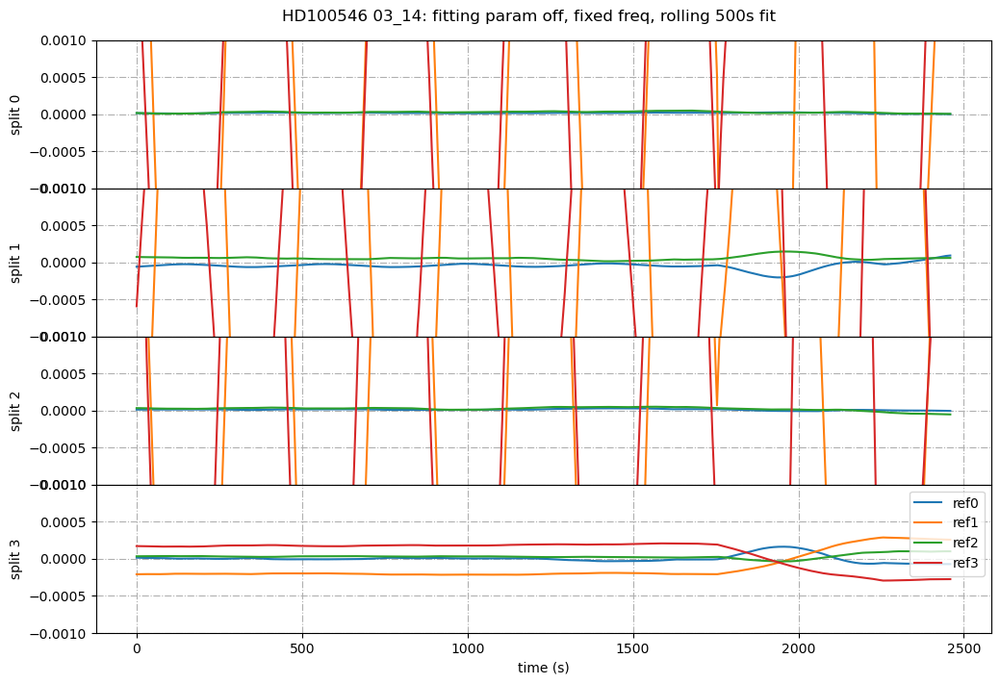

In [71]:
# PLOT: offset value on these fits
n_param = 2

fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(12,8), facecolor='white', sharex=True)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"HD100546 03_14: fitting param {param_names[n_param]}, fixed freq, rolling 500s fit", y=0.92)

param_names = ["amp", "phase", "off"]

for e in range(4):
    axs[e].plot(fits_all[e,:,:,n_param].T, label=[f'ref{i}' for i in range(4)])
    axs[e].set_ylabel(f"split {e}")
    axs[e].set_ylim(top=.001, bottom=-0.001)
    axs[e].grid(linestyle='-.')

axs[e].legend()
plt.xlabel('time (s)')
plt.show()

# March 16th 03_16 - BetaPic, A-C

MOD : 1   TRIG : 1   FREQ : 1   SEPS : 22   ANGS : -20   AMPS : 0.02   CROSS : 1 

In [7]:
sky_dir_0316_BetaPic_B = data_dir + "03_16_spark_BetaPic_B/camwfs/"

In [8]:
spkl.print_sparkle_params(spkl.get_spark_params(sky_dir_0316_BetaPic_B))

MOD : 1   TRIG : 1   FREQ : 1   SEPS : 22   ANGS : -20   AMPS : 0.02   CROSS : 1  


In [10]:
# testing: the other lab reader
data_l_0316 = data_dir + "LAB/lab_1800_spark_1Hz_amp020_sep22_angn20/camwfs/"

In [12]:
reload(spkl)
sp_sky_0314 = spkl.Spark(sky_dir_0316_BetaPic_B, data_l_0316, dir_calib, dark, mask, ref) #skipping bc FREQ

HZ value: 1800
HZ value: 1800
Number of DATA files:  5990841
Number of REF files:  18000
MOD : 1   TRIG : 1   FREQ : 1   SEPS : 22   ANGS : -20   AMPS : 0.02   CROSS : 1  
MOD : 1   TRIG : 1   FREQ : 1   SEPS : 22   ANGS : -20   AMPS : 0.02   CROSS : 1  
Found saved lab ref at:  /home/eden/data/2023A/LAB/lab_1800_spark_1Hz_amp020_sep22_angn20/lab_ref.fits


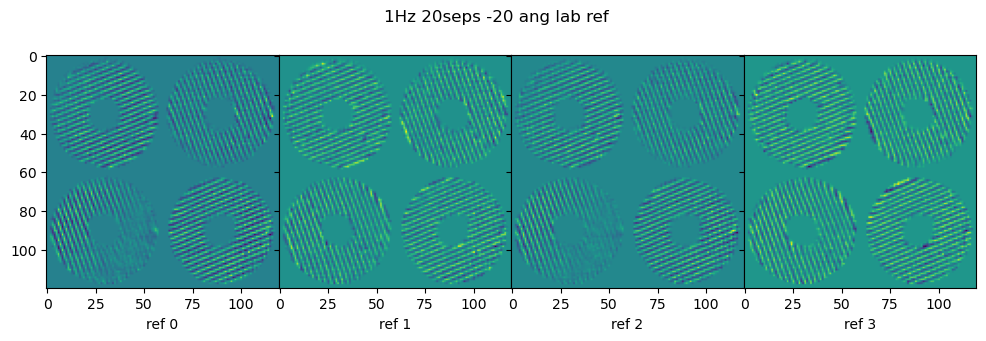

In [15]:
#sp_sky_0316.labref_norm.shape

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4), facecolor='white', sharey=True)
fig.subplots_adjust(wspace=0)
plt.suptitle(f"1Hz 20seps -20 ang lab ref", y=0.90)

for e in range(4):
    axs[e].imshow(sp_sky_0314.labref[e], label = f'ref {e}')
    axs[e].set_xlabel(f"ref {e}")

plt.show()